# Introduction to fMRI Preprocessing

เนื่องจากบทเรียนนี้จะมีการใช้คำศัพท์ทางเทคนิคและ concept ของ signal processing อยู่พอสมควร ขอให้ผู้เรียนศึกษาเนื้อหาจากบทเรียนของ Brain Code Camp โดยเฉพาะเนื้อหา Signal Processing ก่อนเพื่อให้สามารถทำความเข้าใจเนื้อหาในบทเรียนนี้ได้ง่ายมากขึ้น

ในบทเรียนนี้ เราจะนำเอาองค์ความรู้เกี่ยวกับ fMRI ที่เราได้เรียนมาจาก Brain Building Blocks เช่น บทเรียน [fMRI studies](https://youtu.be/ymWZEE1QwfE?si=cgSxi2B_IviHO1-u) และ บทเรียน [fMRI signal](https://youtu.be/wV6rvcpbsvQ?si=oKJH_he6gddi1jHq) มาต่อยอดผ่านการเขียนโค้ดโปรแกรมที่ preprocess ข้อมูล fMRI เบื้องต้น

<br>

ข้อมูล fMRI เป็นข้อมูลที่โดยทั่วไปมี 4 มิติ (x,y,z,t) ประกอบด้วย
- spatial dimensions: x, y, z
- time dimension: t

เราสามารถมองโดยประมาณว่าข้อมูล fMRI คือข้อมูลภาพ MRI 3 มิติ ที่มีแกนเวลาเพิ่มเข้ามา หรือมองเป็น video ของภาพ MRI ก็ได้

ในปัจจุบัน มี software ที่เราสามารถเรียกใช้เพื่อทำการ preprocess หรือวิเคราะห์ข้อมูล fMRI เป็นจำนวนมาก เช่น [FSL](https://www.fmrib.ox.ac.uk/fsl), [Freesurfer](https://surfer.nmr.mgh.harvard.edu), [SPM](https://www.fil.ion.ucl.ac.uk/spm), [fMRIPrep](https://fmriprep.org) และ [QuNex](https://qunex.yale.edu/) แต่ในบทเรียนนี้ เราจะลองเรียกใช้ [FSL](https://www.fmrib.ox.ac.uk/fsl) ใน Python ผ่าน wrapper ที่มีชื่อว่า [fslpy](https://open.win.ox.ac.uk/pages/fsl/fslpy/) เป็นหลัก และเรียกใช้ [nibabel](https://nipy.org/nibabel/) มาช่วยทำบางขั้นตอนด้วย



<br>

**หมายเหตุ**

ในบทเรียนนี้เราทำทุกขั้นตอนใน Google Colab สำหรับเป็นตัวอย่างประกอบการเรียนรู้ แต่ในทางปฏิบัตินั้น เรามักใช้ computer server ในการคำนวณเป็นหลัก เนื่องจากข้อมูล fMRI มีจำนวนมิติถึง 4 มิติ ทำให้ต้องใช้พื้นที่จัดเก็บข้อมูลและใช้ทรัพยากรการคำนวณ (computational resource) สูง โดยเฉพาะอย่างยิ่งในกรณีที่เราต้องการ preprocess และวิเคราะห์ข้อมูล fMRI จากหลายหลาย subjects มาเปรียบเทียบกัน
  - ถ้าหากว่าเราใช้พวก command line เป็น เราสามารถใช้ FSL โดยตรงได้เลย ไม่มีความจำเป็นจะต้องใช้ fslpy ก็ได้









# Tutorial Overview

เวลาเราจะทำการทดลองที่เกี่ยวข้องกับ fMRI เรามักจะเก็บข้อมูลอื่น ๆ เช่น structural MRI หรือ magnetic field map มาควบคู่ไปด้วย เพื่อนำมาใช้ประโยชน์ในหลาย ๆ ด้าน เช่น การนำมาใช้ทำ co-registration และใช้ลด artifacts ได้

ทำให้เราจะต้องทำการ process ข้อมูลหลายประเภทเป็น เช่น
1. ข้อมูล structural MRI ซึ่งเป็นข้อมูลที่มี spatial resolution ค่อนข้างดี
2. ข้อมูล functional MRI ซึ่งข้อมูลที่มักจะมี spatial resolution ต่ำกว่า structural MRI มาก แต่มีข้อมูลแกนเวลาเพิ่มเข้ามา
3. ข้อมูล magnetic field map เช่น B0 map ซึ่งให้ข้อมูลเกี่ยวกับ local magnetic field ของแต่ละตำแหน่ง (x,y,z) ซึ่งสามารถนำเอามาใช้แก้ artifacts ได้ โดยเฉพาะ artifacts ที่เกิดจาก magnetic field inhomogeneity

ในบทเรียนนี้เราจะได้ลองนำเอา structual MRI มาช่วยในการ preprocess และปรับแก้ fMRI ให้มีคุณภาพที่ดีขึ้น พร้อมสำหรับการนำเอาไปวิเคราะห์ผลต่อได้แม่นยำมากยิ่งขึ้น

# Setting Up

## Install FSL

ขั้นตอนนี้เราจะลงโปรแกรมชื่อว่า FSL ซึ่งเป็นหนึ่งในโปรแกรมสำหรับ process และ analyze ข้อมูล MRI หลายประเภท (ทั้ง structural, functional และ diffusion) ที่ได้รับความนิยมมาก

ผู้เรียนที่สนใจสามารถดูรายละเอียดการ install เพิ่มเติมได้[ที่นี่](https://fsl.fmrib.ox.ac.uk/fsl/docs/#/install/index)

<br>

**หมายเหตุ** ขั้นตอนนี้จะกินเวลาค่อนข้างนาน (15 - 25 นาทีบน Google Colab) ซึ่งถ้าเรา install โปรแกรม FSL บนเครื่องคอมพิวเตอร์ส่วนตัวของเรา ก็จะเสียเวลา install ครั้งเดียว แล้วสามารถเรียกใช้งานได้เรื่อย ๆ แต่ถ้าเรารันบน Google Colab ที่เปิด session ใหม่ ก็จะต้องทำขั้นตอนนี้ใหม่


In [1]:
!wget https://fsl.fmrib.ox.ac.uk/fsldownloads/fslinstaller.py
!python fslinstaller.py -d "/usr/local/fsl"

--2026-07-30 16:03:03--  https://fsl.fmrib.ox.ac.uk/fsldownloads/fslinstaller.py
Resolving fsl.fmrib.ox.ac.uk (fsl.fmrib.ox.ac.uk)... 129.67.248.66
Connecting to fsl.fmrib.ox.ac.uk (fsl.fmrib.ox.ac.uk)|129.67.248.66|:443... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: https://fsl.fmrib.ox.ac.uk/fsldownloads/fslconda/releases/fslinstaller.py [following]
--2026-07-30 16:03:04--  https://fsl.fmrib.ox.ac.uk/fsldownloads/fslconda/releases/fslinstaller.py
Reusing existing connection to fsl.fmrib.ox.ac.uk:443.
HTTP request sent, awaiting response... 200 OK
Length: 151999 (148K) [application/octet-stream]
Saving to: ‘fslinstaller.py’

fslinstaller.py     100%[===================>] 148.44K   412KB/s    in 0.4s    

2026-07-30 16:03:04 (412 KB/s) - ‘fslinstaller.py’ saved [151999/151999]

FSL installer version: 3.20.0
Press CTRL+C at any time to cancel installation
Running the installer script as root user is discouraged! You should
run this script as a regu

จัดการเรื่อง environment variable เพื่อให้เรียกใช้ FSL ได้

In [2]:
# Set environment variables
import os
os.environ['FSLDIR'] = '/usr/local/fsl'
os.environ['FSLOUTPUTTYPE'] = 'NIFTI_GZ'
os.environ['FSLMULTIFILEQUIT'] = 'TRUE'
os.environ['FSLTCLSH'] = os.path.join(os.getenv('FSLDIR', ''), 'bin/fsltclsh')
os.environ['FSLWISH'] = os.path.join(os.getenv('FSLDIR', ''), 'bin/fslwish')
os.environ['FSL_LOAD_NIFTI_EXTENSIONS'] = '0'
os.environ['FSL_SKIP_GLOBAL'] = '0'

## Install nilearn และ fslpy

In [3]:
!pip install nilearn
!pip install fslpy

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.5/79.5 kB 1.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.5/11.5 MB 69.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.0/11.0 MB 69.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 73.1/73.1 kB 7.2 MB/s eta 0:00:00
  Attempting uninstall: requests
    Found existing installation: requests 2.32.4
    Uninstalling requests-2.32.4:
      Successfully uninstalled requests-2.32.4
  Attempting uninstall: pandas
    Found existing installation: pandas 2.2.2
    Uninstalling pandas-2.2.2:
      Successfully uninstalled pandas-2.2.2
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
google-colab 1.0.0 requires pandas==2.2.2, but you have pandas 3.0.5 which is incompatible.
google-colab 1.0.0 requires requests==2.32.4, but you have requests 2.34.2 which is incompatible.
   ━

## Download ข้อมูลตัวอย่าง

In [4]:
!git clone https://github.com/braincodecamp/modality-exploration-fMRI.git
!mv modality-exploration-fMRI/* .
!rm -r modality-exploration-fMRI

Cloning into 'modality-exploration-fMRI'...
remote: Enumerating objects: 17, done.
remote: Total 17 (delta 0), reused 0 (delta 0), pack-reused 17 (from 1)
Receiving objects: 100% (17/17), 160.39 MiB | 17.83 MiB/s, done.
Updating files: 100% (12/12), done.


## Import modules ที่จะใช้งาน

In [5]:
import nibabel as nib
from nilearn.plotting import plot_anat, plot_img
from nilearn.image import index_img

import fsl
from fsl.data.melodicanalysis import getComponentPowerSpectra, getComponentTimeSeries
from fsl.wrappers import bet, flirt, fslmaths, mcflirt, fslroi, fslmerge, topup, applytopup, melodic

import numpy as np
import os
import matplotlib.pyplot as plt
from ipywidgets import interact, IntSlider, Dropdown
import ipywidgets as widgets
from IPython.display import Image, display

## เตรียม directories และ ฟังก์ชันสำหรับ visualize ข้อมูล

ในการเรียกใช้คำสั่งทั่วไปของ FSL มักจะมีการการอ่านไฟล์และ/หรือเขียนไฟล์เข้ามาเกี่ยวข้องเสมอ ในส่วนนี้เราจึงสร้าง output folder เอามาเก็บไฟล์ที่ถูกสร้างขึ้นในแต่ละขั้นตอนไว้

In [6]:
# กำหนด working directory สำหรับเก็บและวิเคราะห์ข้อมูล
data_path = 'data'          # directory ที่มีข้อมูลที่เราต้องการจะ preprocess
template_path = 'template'  # directory ที่เก็บข้อมูล template
output_path = 'output'      # directory สำหรับเก็บข้อมูลที่ผ่านการประมวลผลแล้ว

# สร้าง output directory
os.makedirs(output_path, exist_ok=True)

เตรียมฟังก์ชันสำหรับ plot ข้อมูล structural MRI

In [7]:
# ฟังก์ชันสำหรับแสดง MRI
def plot_brain_3D(file_path, slider_name1='Orientation', slider_name2='Slice'):

    # โหลดภาพ MRI
    brain_img = nib.load(file_path)
    brain_data = brain_img.get_fdata()

    # ฟังก์ชันกำหนดแต่ละ slice
    def plot_slice(axis, slice_idx):
        plt.figure(figsize=(10, 10))
        if axis == 0:
            plt.imshow(brain_data[slice_idx, :, :].T, cmap='gray', origin='lower')
        elif axis == 1:
            plt.imshow(brain_data[:, slice_idx, :].T, cmap='gray', origin='lower')
        elif axis == 2:
            plt.imshow(brain_data[:, :, slice_idx].T, cmap='gray', origin='lower')
        plt.axis('off')
        plt.show()

    # สร้าง widget สำหรับเลือกแกนและ slice
    axis_slider = widgets.IntSlider(min=0, max=2, step=1, description=slider_name1)
    slice_slider = widgets.IntSlider(min=0, max=brain_data.shape[2]-1, step=1, description=slider_name2)

    def update_slice_range(*args):
        if axis_slider.value == 0:
            slice_slider.max = brain_data.shape[0] - 1
        elif axis_slider.value == 1:
            slice_slider.max = brain_data.shape[1] - 1
        elif axis_slider.value == 2:
            slice_slider.max = brain_data.shape[2] - 1

    axis_slider.observe(update_slice_range, 'value')

    interact(plot_slice, axis=axis_slider, slice_idx=slice_slider)

เตรียมฟังก์ชันสำหรับใช้ plot ข้อมูล fMRI

In [8]:
# ฟังก์ชันสำหรับแสดง fMRI
def plot_brain_4D(file_path, slider_name1="Orientation", slider_name2="Slice", slider_name3="Time point"):

    # โหลดภาพ MRI
    brain_img = nib.load(file_path)
    brain_data = brain_img.get_fdata()

    # ฟังก์ชันกำหนดแต่ละ slice
    def plot_slice(axis, slice_idx, time_idx):
        plt.figure(figsize=(10, 10))
        if axis == 0:
            plt.imshow(brain_data[slice_idx, :, :, time_idx].T, cmap='gray', origin='lower')
        elif axis == 1:
            plt.imshow(brain_data[:, slice_idx, :, time_idx].T, cmap='gray', origin='lower')
        elif axis == 2:
            plt.imshow(brain_data[:, :, slice_idx, time_idx].T, cmap='gray', origin='lower')
        plt.axis('off')
        plt.show()

    # สร้าง widget สำหรับเลือกแกน, slice, และเวลา
    axis_slider = widgets.IntSlider(min=0, max=2, step=1, description=slider_name1)
    slice_slider = widgets.IntSlider(min=0, max=brain_data.shape[2]-1, step=1, description=slider_name2)
    time_slider = widgets.IntSlider(min=0, max=brain_data.shape[3]-1, step=1, description=slider_name3)

    def update_slice_range(*args):
        if axis_slider.value == 0:
            slice_slider.max = brain_data.shape[0] - 1
        elif axis_slider.value == 1:
            slice_slider.max = brain_data.shape[1] - 1
        elif axis_slider.value == 2:
            slice_slider.max = brain_data.shape[2] - 1

    axis_slider.observe(update_slice_range, 'value')

    # เพิ่ม interactive plot ด้วยแกน, slice, และเวลา
    interact(plot_slice, axis=axis_slider, slice_idx=slice_slider, time_idx=time_slider)

# Structural MRI Preprocessing

ตามที่ได้กล่าวไว้ในตอนต้นของบทเรียน เราสามารถนำเอา structural MRI เช่น  T1-weighted (T1w) image และ T2-weighted (T2w) image
มาใช้ประโยชน์ได้หลายแบบ
- นำมาวิเคราะห์ค่า imaging derived parameters (IDPs) ในแต่ละ area ที่สนใจได้มากมาย เช่น volume, cortical thickness, surface area และ gyrification
- นำมาใช้ในการลดหรือแก้ artifacts และ noise (สัญญาณรบกวน)
- นำมาใช้ในการทำให้ข้อมูลทั้งหมด (ซึ่งอาจจะเก็บมาด้วย resolution ที่ต่างกัน หรือมี orientation ของอวัยวะที่เราเก็บข้อมูลมาไม่ตรงกัน) ให้มีตำแหน่งที่ตรงกัน (co-registration) เพื่อให้สามารถนำมาเปรียบเทียบกันได้ตรงไปตรงมามากขึ้น

<br>

ใน section นี้เราจะ preprocess ข้อมูล structural MRI แล้วเก็บผลที่ได้เพื่อใช้ประกอบการทำ co-registration กับภาพ fMRI ในภายหลัง โดยมีขั้นตอนโดยสังเขปดังนี้
1. กำจัดส่วนกะโหลดออก (skull stripping) โดยการใช้ [FSL BET](https://open.win.ox.ac.uk/pages/fslcourse/practicals/intro2/index.html)
2. Register รูป structural MRI ไปที่รูป template โดยการใช้ [FSL FLIRT](https://web.mit.edu/fsl_v5.0.10/fsl/doc/wiki/FLIRT%282f%29StepByStep.html) เพื่อให้เราสามารถนำเอาข้อมูลจากคนละ subject ซึ่งอาจมีตำแหน่งการเก็บข้อมูลที่แตกต่างกันมาเปรียบเทียบกันได้ดีมากขึ้น ในขั้นตอนนี้เราจะเก็บเอา transformation matrix เอาไว้ใช้ในการ transform ข้อมูล fMRI ในภายหลังด้วย

In [9]:
# โหลด raw MRI
struc = fsl.data.image.Image(os.path.join(data_path, 'struc.nii.gz'))

In [10]:
# ดูจำนวนมิติของข้อมูล
struc.shape

(230, 320, 320)

In [11]:
# Visualize raw image
plot_brain_3D(os.path.join(data_path, 'struc.nii.gz'))

interactive(children=(IntSlider(value=0, description='Orientation', max=2), IntSlider(value=0, description='Sl…

## FSL BET for skull stripping

ใช้ FSL BET ในการกำจัดส่วนที่เป็นกะโหลกออกไป ให้เหลือแต่บริเวณสมอง

In [12]:
# brain extraction เพื่อตัดกะโหลกออกให้เหลือแต่สมอง แล้ว save ไว้ใน output folder โดยใช้ชื่อไฟล์ว่า struc_brain.nii.gz
bet_struc = bet(struc, output=os.path.join(output_path, 'struc_brain.nii.gz'), mask=True)

ดูรูปก่อนที่จะตัดกะโหลกออก โดยเราสามารถปรับค่าได้ 2 ค่าหลัก ๆ

1. ปรับ axis เพื่อดู plane ต่าง ๆ ของข้อมูล MRI เช่น axial, coronal และ sagittal ตามที่ได้เคยเห็นกันมาแล้วในบทเรียน [Data Handling & Exploration](https://youtu.be/SlgIA-lmAwM?si=PZUdRHQY3uKo87lZ) ของ Brain Building Blocks
2. เลือกตำแหน่งของ slice ที่เราต้องการดูใน plane ที่เราเลือกมา

เปรียบเทียบข้อมูลก่อนและหลังจากที่กำจัดส่วนกะโหลกออกไปแล้ว เพื่อตรวจสอบให้มั่นใจว่า FSL BET ได้ทำหน้าที่ได้อย่างถูกต้อง

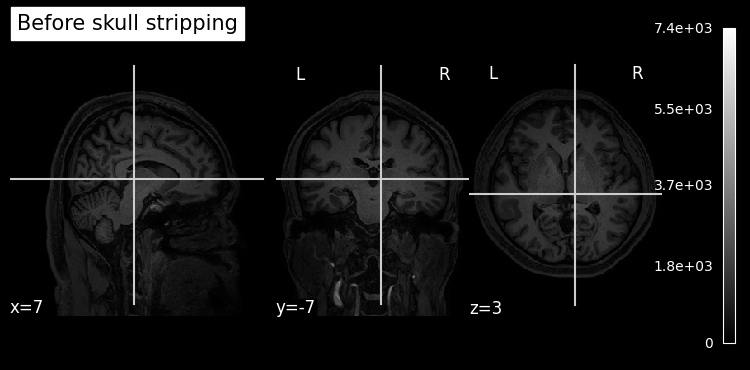

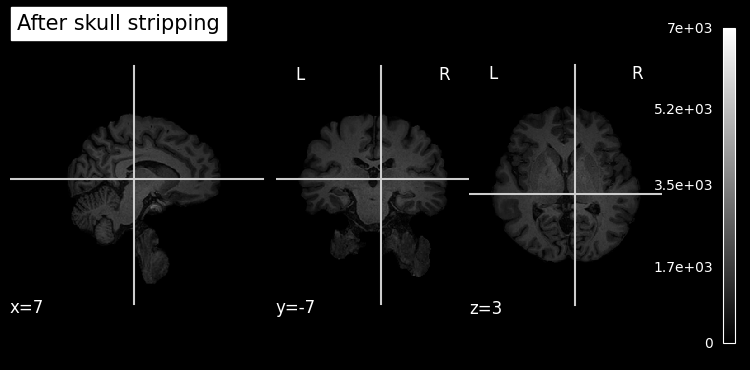

In [13]:
# ดูภาพทั้ง 3 planes ของข้อมูลก่อนการทำ skull stripping
plot_anat(os.path.join(data_path, 'struc.nii.gz'),
          cut_coords=(7,-7,3), # ระบุตำแหน่ง (x,y,z) ที่ต้องการ visualize
          title='Before skull stripping')

# ดูภาพทั้ง 3 planes ของข้อมูลหลังจากการทำ skull stripping
plot_anat(os.path.join(output_path, 'struc_brain.nii.gz'),
          cut_coords=(7,-7,3), # ระบุตำแหน่ง (x,y,z) ที่ต้องการ visualize
          title='After skull stripping')

In [14]:
# สร้าง interactive plot ที่เลือกดู axis และ slice ที่ต้องการได้
plot_brain_3D(os.path.join(output_path, 'struc_brain.nii.gz'))

interactive(children=(IntSlider(value=0, description='Orientation', max=2), IntSlider(value=0, description='Sl…

## Investigate the MNI152 template and MRI Atlas

ตามที่ได้กล่าวไว้ข้างต้น ในหลาย ๆ ครั้งเราต้องการทำการเปรียบเทียบข้อมูลที่ถูกเก็บมาจากคนหลาย ๆ คนหรือกลุ่มตัวอย่าง ซึ่งมักจะ
- มี orientation ของอวัยวะที่เราเก็บข้อมูลมาไม่ตรงกัน (ภาพถูกเก็บมาจากตำแหน่งและทิศทาง/องศาที่ไม่ตรงกัน)
- มี resolution แตกต่างกัน
- ใช้ imaging modality ที่แตกต่างกันในการเก็บมา เช่น เราอาจเก็บข้อมูลจากคน ๆ เดียวกัน แต่เก็บข้อมูล fMRI และ PET มา แล้วเราต้องการเปรียบเทียบกัน

ทำให้เราทำการเปรียบเทียบข้อมูลที่มีความหลากหลายแบบนี้ได้ค่อนข้างยาก

<br>

ในการก้าวข้ามความซับซ้อนตรงนี้ เราสามารถใช้กระบวนการ registration เพื่อแปลง (transform) ข้อมูลทั้งหมดที่เรามีให้มีตำแหน่งของอวัยวะต่าง ๆ ตรงกับ template บางอย่าง ถ้าหากการทำ registration มีความแม่นยำสูง ก็จะทำให้ได้ข้อมูลทั้งหมดที่เก็บมามีตำแหน่งของอวัยวะโดยประมาณ ตรงกันกับตัวข้อมูล template ส่งผลให้เราสามารถเปรียบเทียบข้อมูลทั้งหมดได้อย่างตรงไปตรงมามากยิ่งขึ้น

### MNI152 template

ใน section นี้เราจะใช้ข้อมูล template ที่มีชื่อว่า MNI152 template ซึ่งสร้างจากการเฉลี่ยภาพสมองจากคนทั้งหมด 152 คน

เรามาลอง plot ดูข้อมูล MNI152 template กัน

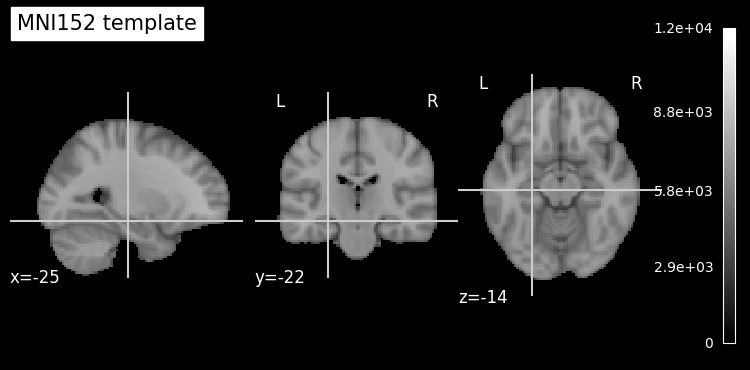

In [15]:
plot_anat(os.path.join(template_path, 'MNI152_T1_2mm_brain.nii.gz'),
          cut_coords=(-25,-22,-14),
          title='MNI152 template')

In [16]:
plot_brain_3D(os.path.join(template_path, 'MNI152_T1_2mm_brain.nii.gz'))

interactive(children=(IntSlider(value=0, description='Orientation', max=2), IntSlider(value=0, description='Sl…

### MRI Atlas

นอกจากข้อมูล template แล้ว ข้อมูลอีกประเภทที่มีประโยชน์ก็คือ MRI atlas

MRI atlas เป็นภาพสมองที่ระบุพิกัดต่าง ๆ ซึ่งสามารถใช้ในการระบุตำแหน่งหรือขอบเขตสมองที่ต้องการศึกษา โดย MRI atlas มักจะมีข้อมูลเกี่ยวกับการแบ่งส่วนต่าง ๆ ของสมอง (brain parcellation and segmentation) ทำให้เราสามารถใช้ MRI atlas ในการดึงสมองส่วนที่จำเพาะจากข้อมูลใด ๆ ก็ตามที่ผ่านการทำ registration ไปยัง standard template มาแล้วได้

<br>

ใน subsection นี้เราจะใช้ MRI atlas จากผลงานตีพิมพ์ชื่อ The organization of the human cerebral cortex estimated by intrinsic functional connectivity ซึ่งเป็น 1 ใน MRI atlas ที่มีความจำเพาะกับข้อมูล MNI152 template

<br>

Yeo, B. T., Krienen, F. M., Sepulcre, J., Sabuncu, M. R., Lashkari, D., Hollinshead, M., Roffman, J. L., Smoller, J. W., Zöllei, L., Polimeni, J. R., Fischl, B., Liu, H., & Buckner, R. L. (2011). The organization of the human cerebral cortex estimated by intrinsic functional connectivity. Journal of neurophysiology, 106(3), 1125–1165. https://doi.org/10.1152/jn.00338.2011

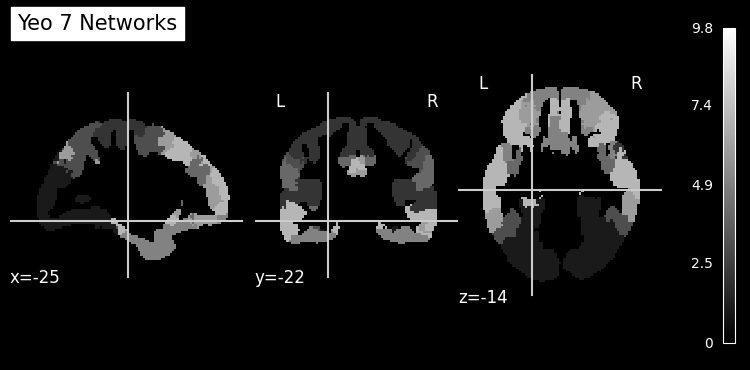

In [17]:
plot_anat(os.path.join(template_path, 'Atlas_Yeo7.nii.gz'),
          cut_coords=(-25,-22,-14),
          title='Yeo 7 Networks')

In [18]:
plot_brain_3D(os.path.join(template_path, 'Atlas_Yeo7.nii.gz'))

interactive(children=(IntSlider(value=0, description='Orientation', max=2), IntSlider(value=0, description='Sl…

ลองดูเฉพาะส่วน hippocampus

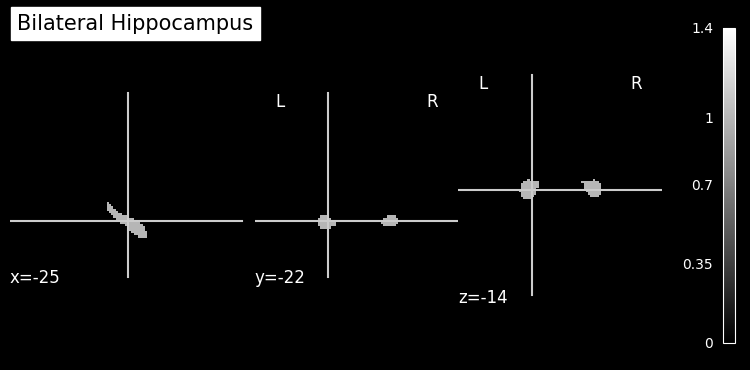

In [19]:
plot_anat(os.path.join(template_path, 'Mask_bilat_hippocampus.nii.gz'),
          cut_coords=(-25,-22,-14),
          title='Bilateral Hippocampus')

In [20]:
# visualize the hippocampus mask
plot_brain_3D(os.path.join(template_path, 'Mask_bilat_hippocampus.nii.gz'))

interactive(children=(IntSlider(value=0, description='Orientation', max=2), IntSlider(value=0, description='Sl…

## FSL FLIRT/FNIRT for Coregistration

หลังจากที่เราได้ทำการกำจัดกะโหลกและทำการเตรียมข้อมูล template แล้ว เราจะมา register ข้อมูล structural ที่เราเก็บมาไปยังข้อมูล template ที่ได้เตรียมไว้กัน

<br>

Registration เป็นกระบวนการ transform ข้อมูลจาก space นึงไปอีก space นึงที่เราต้องการ ซึ่งใน section นี้เราต้องการ register ข้อมูลจาก space ตั้งต้นที่เราเก็บข้อมูลมา ไปสู่ space ของข้อมูล template เพื่อให้ง่ายต่อการใช้ข้อมูล MRI atlas และ/หรือ เปรียบเทียบข้อมูลในระดับกลุ่มว่ามีความแตกต่างกันอย่างไรภายใต้ space เดียวกัน

การทำ registration นั้น สามารถทำได้ด้วยเทคนิคที่เป็นเชิงเส้น (linear transformation) หรือเทคนิคที่ไม่เป็นเชิงเส้น (nonlinear transformation) ซึ่งใน FSL มีเทคนิคหลัก ๆ ที่เป็นที่นิยม 2 เทคนิค คือ
1. FLIRT ซึ่งเป็น linear transformation ที่ผู้ใช้งานสามารถเลือก degree of freedom ได้ เช่น 3 (translation only), 6 (translation+rotation), 9 และ 12
2. FNIRT เป็น nonlinear transformation ซึ่งมักจะให้ผลที่ดีกว่า FLIRT แต่ก็แลกมาด้วยระยะเวลาการคำนวณที่มากขึ้น

ในทางปฏิบัติ เรามักจะเริ่มต้นด้วยการใช้ FLIRT ก่อน แล้วตามด้วย FNIRT เพื่อเพิ่มคุณภาพของการทำ registration ให้มากขึ้นอีก

<br>

อย่างไรก็ตาม ใน section นี้เราจะทำแค่ FLIRT ให้ดูเป็นตัวอย่างเท่านั้น เพื่อให้บทเรียนไม่ยาวและไม่ใช้เวลามากจนเกินไป

In [21]:
display(Image(url="https://open.win.ox.ac.uk/pages/fsl/fslpy/_images/nonlinear_registration_process.png"))

เรียกใช้ FSL FLIRT ในการ register ข้อมูล structural MRI ที่ได้ทำการกำจัดกะโหลกไปแล้วในขั้นตอนก่อนหน้า ไปยังข้อมูล MNI152 template โดยเราจะเก็บข้อมูลที่ผ่านการ register ไว้ในไฟล์ชื่อ `struc_brain_to_mni.nii.gz` และเก็บ transformation matrix ที่เราสามารถเอาไปใช้ต่อในภายหลังไว้ในไฟล์ชื่อ `transform_reg_mat_brain_to_mni.mat` ใน output folder

In [22]:
# นำข้อมูลที่ผ่านการกำจัดกะโหลกออกไปแล้วมาใช้งานต่อ
input_image = os.path.join(output_path, 'struc_brain.nii.gz')

# กำหนด reference เผื่อใช้ในการทำ registration
reference_image = os.path.join(template_path, 'MNI152_T1_2mm_brain.nii.gz')

# เตรียม save ข้อมูลที่ผ่านการทำ registration ไว้ใน output folder
output_image = os.path.join(output_path, 'struc_brain_to_mni.nii.gz')

# เตรียม save ตัว matrix ที่ใช้สำหรับการทำ transformation จาก structural MRI ไปยัง template
output_transform_reg_matrix = os.path.join(output_path, 'transform_reg_mat_brain_to_mni.mat')

# เรียกใช้ FLIRT เพื่อ register ข้อมูล
flirt_result = flirt(src=input_image,
                     ref=reference_image,
                     omat=output_transform_reg_matrix,
                     out=output_image)

เปรียบเทียบข้อมูลก่อนและหลังการทำ registration คู่กับข้อมูล template

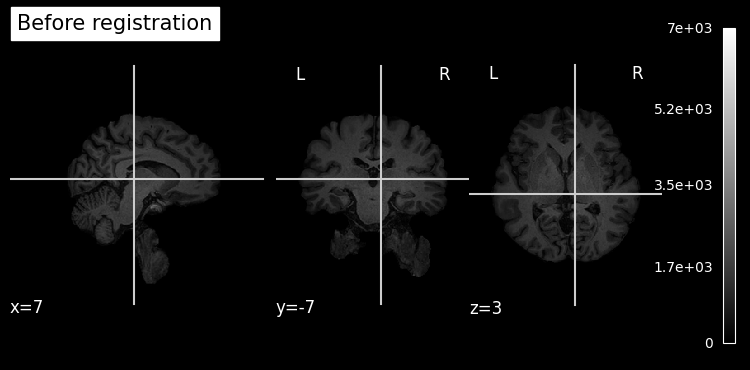

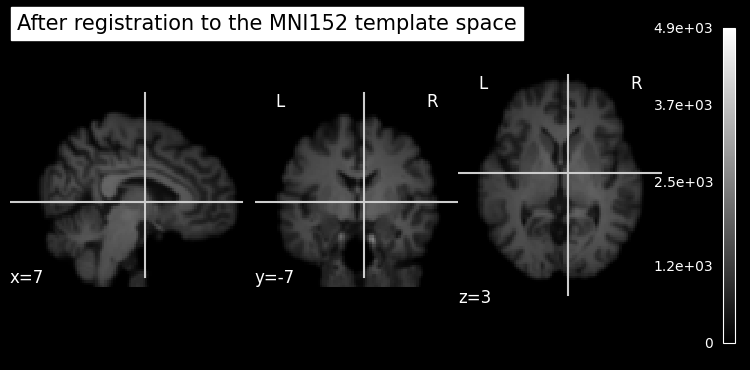

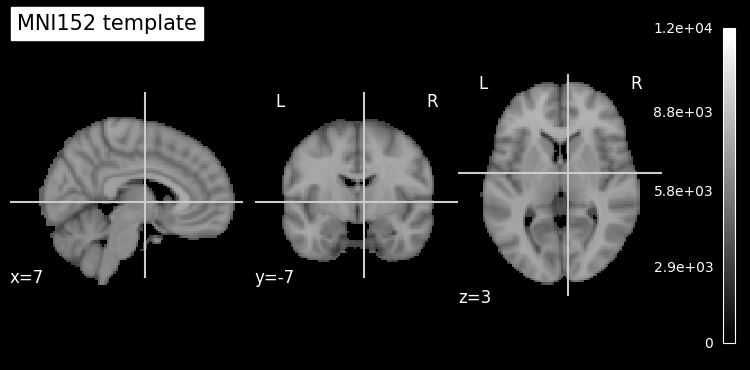

In [23]:
plot_anat(os.path.join(output_path, 'struc_brain.nii.gz'), cut_coords=(7,-7,3), title='Before registration')
plot_anat(os.path.join(output_path, 'struc_brain_to_mni.nii.gz'), cut_coords=(7,-7,3), title='After registration to the MNI152 template space')
plot_anat(os.path.join(template_path, 'MNI152_T1_2mm_brain.nii.gz'), cut_coords=(7,-7,3), title='MNI152 template')

จะเห็นได้ว่าข้อมูล structural MRI ที่ผ่านการทำ registration (row ที่ 2 ในรูป) มีตำแหน่งอวัยวะสอดคล้องกันกับข้อมูล MNI152 template (row ที่ 3 ในรูป) มากขึ้นกว่าข้อมูลก่อนทำ registration (row ที่ 1 ในรูป) มาก

ต่อมาเรามาลองนำ hippocampus mask ทาบลงบนข้อมูลที่ผ่านการทำ registration (`struc_brain_to_mni.nii.gz` ใน output folder)

In [24]:
# ระบุข้อมูลตั้งต้น
input_image = os.path.join(output_path, 'struc_brain_to_mni.nii.gz')

# ระบุ mask สำหรับ hippocampus
mask_image = os.path.join(template_path, 'Mask_bilat_hippocampus.nii.gz')

# ระบุชื่อไฟล์ที่เราจะเก็บผลลัพธ์ไว้
output_image = os.path.join(output_path, 'struc_hippocampus.nii.gz')

# ทำการดึงเอา hippocampus มาดู
fslmaths(input_image).mas(mask_image).run(output=output_image)

{}

ดูผลลัพธ์ที่ได้

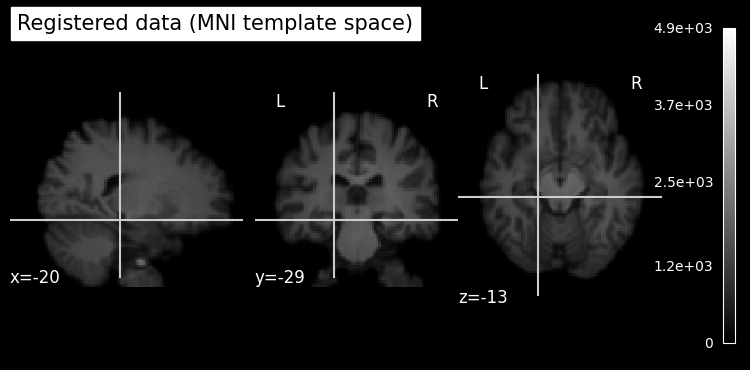

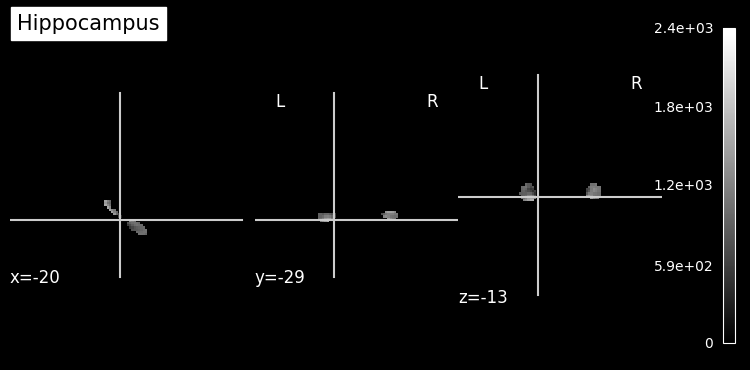

In [25]:
plot_anat(os.path.join(output_path, 'struc_brain_to_mni.nii.gz'), cut_coords=(-20,-29,-13), title='Registered data (MNI template space)')
plot_anat(os.path.join(output_path, 'struc_hippocampus.nii.gz'), cut_coords=(-20,-29,-13), title='Hippocampus')

จะเห็นได้ว่าการทำ registration ไปยัง template ก็จะช่วยให้เราสามารถนำเอา MRI atlas มาใช้ในการศึกษาข้อมูลจากสมองเฉพาะส่วนผ่านการทำ masking (การนำเอา binary array ที่มีขนาดเท่ากับข้อมูลสมองของเรา แต่จะมีค่าเป็น 1 เฉพาะบริเวณที่เราสนใจ และมีค่า 0 ในบริเวณที่เหลือ มาคูณกับข้อมูลตั้งต้น ซึ่งจะทำให้ข้อมูลในบริเวณที่เราไม่สนใจถูกกำจัดออกไป) ได้ถูกต้องมากขึ้น

หากเรานำเอา mask จาก MRI atlas ไปใช้กับข้อมูลที่ไม่ได้ผ่านการทำ registration มาเลย เราจะพบว่า เราจะไม่สามารถดึงตำแหน่งสมองเฉพาะส่วนออกมาได้อย่างแม่นยำ

**หมายเหตุ** หากเรามีเวลาและมีทรัพยากรการคำนวณที่เพียงพอ เราสามารถใช้ nonlinear registration technique เช่น FSL FNIRT ในการทำ registration เพิ่มเติมบนข้อมูลที่ผ่านการทำ FLIRT มาแล้ว เพื่อให้ได้ผลลัพธ์ที่แม่นยำมากยิ่งขึ้นอีกด้วย

นอกจากการเรียกใช้ FLIRT ตามตัวอย่างด้านบนแล้ว เรายังสามารถใช้ tools อื่น ๆ มา process ข้อมูลได้อีก เช่น การใช้ transformation matrix (.mat) ในการ applywarp และ invwarp เพื่อเปลี่ยนภาพไปมาในแต่ละ space เพื่อใช้ในการวิเคราะห์ในรูปแบบอื่น (เช่น Voxel-Based Morphometry (VBM)) ได้

<br>

ในตัวอย่างนี้เราทำการ register ข้อมูล MRI แต่จริง ๆ แล้วเราสามารถใช้เทคนิคเหล่านี้กับ neuroimaging modalities อื่นๆ ได้ เช่น การทำ registration ข้อมูล PET หรือข้อมูล CT ไปยัง MRI เพื่อระบุสมองตำแหน่งต่าง ๆ ในข้อมูล PET/CT ได้อย่างแม่นยำมากยิ่งขึ้น เนื่องจาก structural MRI มีความละเอียดเชิงพื้นที่ (spatial resolution) และ/หรือ contrast ที่มากกว่า

# Functional MRI Preprocessing

หลังจากที่เราได้ทำการ register ข้อมูล structural MRI ไปยังข้อมูล template แล้ว (ซึ่งทำให้เราสามารถใช้ประโยชน์จาก atlas ได้) เราจะมา process ข้อมูล fMRI กัน การ preprocess ข้อมูล fMRI มักจะประกอบไปด้วยหลากหลายขั้นตอน เช่น

1. **Motion Correction**
การเคลื่อนไหวของ subject ระหว่างการเก็บข้อมูลในเครื่อง MRI ส่งผลให้เกิดความคลาดเคลื่อนเชิงตำแหน่งเกิดเป็น motion artifact ได้ ซึ่งการทำ motion correction เพื่อกำจัดหรือลดความรุนแรงของ motion artifact เป็นขั้นตอนที่สำคัญมาก เนื่องจาก motion artifacts เป็น artifact ที่ค่อนข้างกระทบกับคุณภาพของภาพค่อนข้างมาก เมื่อเทียบกับ artifact ประเภทอื่น ๆ การมี motion artifact มักจะทำให้การประมวลผลในขั้นตอนอื่น ๆ คลาดเคลื่อนได้มาก หรือบางทีไม่สามารถใช้งานได้เลยได้ในกรณีที่ motion artifact มีความรุนแรงมากเกินไป

2. **Distortion Correction**
เนื่องจากเครื่อง MRI ทำงานโดยการพึ่งพาสนามแม่เหล็ก (magnetic fields) หลายประเภท (เช่น B0, B1 และ gradient) ซึ่งความแม่นยำในการเก็บข้อมูลและคุณภาพของข้อมูลที่ได้รับจะขึ้นอยู่กับความสามารถในการสร้าง local magnetic field ในแต่ละตำแหน่งให้ตรงกับที่ได้ออกแบบไว้ แต่ในความเป็นจริง มีองค์ประกอบหลายอย่างที่ส่งผลให้ local magnetic field ที่เกิดขึ้นจริงคลาดเคลื่อนไปจากสิ่งที่ได้คาดการณ์ไว้ เช่น
  - hardware imperfection
  - การมีโลหะที่เข้าไปอยู่ใกล้ ๆ บริเวณเครื่อง MRI รวมถึงวัสดุอุดฟันบางประเภท
  - การลืมปิดประตูห้องขณะเก็บข้อมูล MRI

  การที่ local magnetic field ที่เกิดขึ้นจริงตอนเก็บข้อมูล แตกต่างไปจากสิ่งที่ได้คาดการณ์ไว้ ส่งผลให้เกิด artifacts หลากหลายรูปแบบได้ ทำให้ข้อมูลภาพที่ได้มีความคลาดเคลื่อนไป เช่น ภาพเบลอ ภาพบิดเบี้ยว และ ภาพมีความเข้มที่ลดลงในบางบริเวณ จึงมีความจำเป็นที่จะต้องแก้ปัญหาเหล่านี้

3. **Slice Timing Correction**
ในการสแกน fMRI ข้อมูลจากแต่ละ slice จะถูกเก็บในเวลาที่ต่างกัน การปรับช่วงเวลาของแต่ละ slice ให้ตรงกับความเป็นจริงจะช่วยให้ได้ข้อมูล BOLD response ที่ตรงกับความเป็นจริงมากขึ้น ซึ่งมีความจำเป็นอย่างมากในกรณีของการทำ task-based fMRI แต่ในกรณี resting-state fMRI อาจข้ามขั้นตอนนี้ไปได้ (ข้อมูล fMRI ที่เราใช้ในบทเรียนนี้จะเป็น resting-state fMRI เราจึงจะไม่มี section การทำ slice timing correction ในบทเรียนนี็)

4. **Smoothing**
การทำ spatial low-pass filtering เช่น การใช้ kernel ที่มีคุณลักษณะเป็น low-pass filter มา spatially convolve กับข้อมูล fMRI เพื่อลด noise โดยแลกกับ spatial resolution ที่ลดลง ในทางปฏิบัติ Gaussian kernel มักถูกใช้ในการทำขั้นตอนนี้

5. **Coregistration and Normalization**
ตามที่ได้เห็นมาแล้วใน structural MRI section ข้อมูล fMRI ก็ควรได้รับการ register ไปยัง standard space เช่นกัน เพื่อให้เราสามารถเปรียบเทียบข้อมูลระหว่างกลุ่มได้ (spatial normalization) ซึ่งเรามักจะทำ [two-step registration](https://web.mit.edu/fsl_v5.0.10/fsl/doc/wiki/FLIRT%282f%29StepByStep.html) ซึ่งเป็นการทำ 2 ขั้นตอนต่อเนื่องกัน
  1. register ข้อมูล fMRI ไปยัง structural MRI
  2. register ข้อมูล fMRI ที่ผ่านขั้นตอนแรกมาแล้ว ไปยัง standard space เช่น MNI152 template

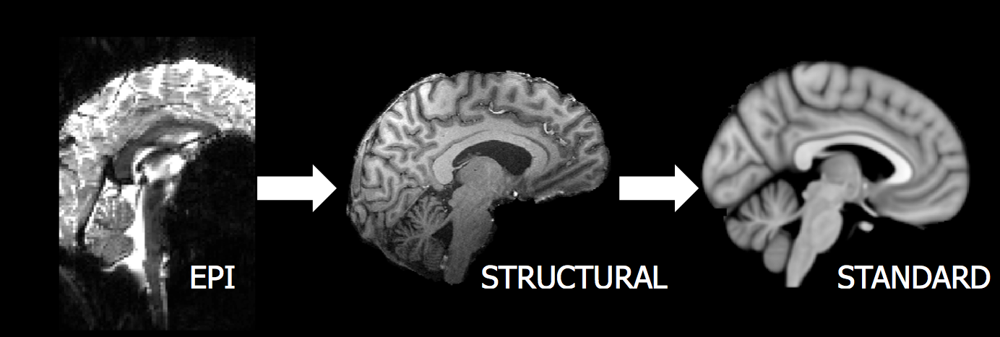

image source: https://web.mit.edu/fsl_v5.0.10/fsl/doc/wiki/FLIRT%282f%29StepByStep.html


In [26]:
display(Image('./tutorial-graphics/two-step-registration.png'))
print(f'image source: https://web.mit.edu/fsl_v5.0.10/fsl/doc/wiki/FLIRT%282f%29StepByStep.html')

นอกจากเทคนิคที่ได้กล่างถึงด้านบนแล้ว ยังมีเทคนิคอื่น ๆ อีกที่สามารถใช้ในการ preprocess ข้อมูล fMRI ให้มีประสิทธิภาพมากขึ้น หลายอย่าง เช่น การใช้ Independent Component Analysis (ICA) เพื่อกำจัด artifacts บางประเภท

## Visualize fMRI Data

In [27]:
# โหลดตัวอย่างภาพ fMRI ซึ่งมี 4 มิติ (x,y,z และ t ซึ่งเป็นเวลา)
plot_brain_4D(os.path.join(data_path, 'func_AP.nii.gz'))

interactive(children=(IntSlider(value=0, description='Orientation', max=2), IntSlider(value=0, description='Sl…

เรามักจะพบความบิดเบี้ยวในข้อมูล fMRI ซึ่งจะขึ้นอยู่กับทิศทางการเก็บข้อมูล เมื่อเทียบกับทิศทางของสนามแม่เหล็ก โดยมักจะถูกเหนี่ยวนําให้เกิดการเปลี่ยนแปลงในแกนใดแกนหนึ่ง เช่น
- หน้าไปหลัง (anterior-posterior; A2P)
- หลังไปหน้า (posterior-anterior; P2A)
- ซ้าย-ขวา (left-right; L2R)
- ขวา-ซ้าย (right-left; R2L)

ใน cell ถัดไป เราจะทำการสำรวจดูข้อมูล fMRI ที่ถูกเก็บมาสองลักษณะ ประกอบด้วย
1. Anterior-posterior (A2P)
2. Posterior-anterior (P2A)

ซึ่งการเปลี่ยนแปลงที่เกิดขึ้นคือข้อมูลบางบริเวณจะมีลักษณะ ‘ยุบเข้า’ และข้อมูลบางบริเวณจะ ‘โปนออก’ ดังภาพตัวอย่างด้านล่าง ซึ่งจะเป็นภาพที่เราได้จาก time point แรก

**ข้อสังเกต** เนื่องจากข้อมูล fMRI เป็นข้อมูลที่มี 4 มิติ (x,y,z,t) แปลว่า ณ เวลาใด ๆ (a specific time point) ข้อมูลที่เรามีจะเป็นข้อมูล 3 มิติ (x,y,z) ทำให้บางทีเราจะเรียกข้อมูล ณ เวลาใด ๆ ว่า volume

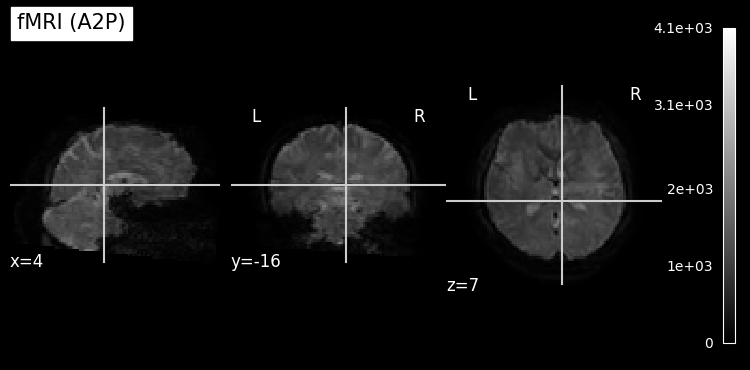

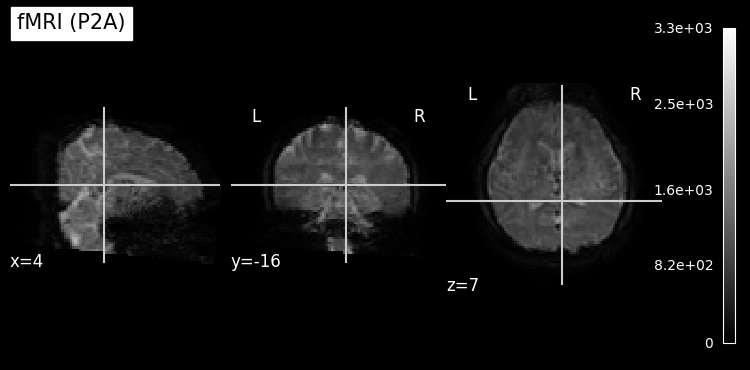

In [28]:
# เปรียบเทียบ image distortion จากการเก็บข้อมูลใน 2 directions ซึ่งประกอบด้วย A2P (Anterior-to-Posterior) และ P2A (Posterior-to-Anterior)
target_time_index = 1 # เลือก time point ที่ต้องการ
AP_path = (os.path.join(data_path, 'func_AP.nii.gz'))
PA_path = (os.path.join(data_path, 'func_PA.nii.gz'))

# Plot ข้อมูลสามมิติ (x,y,z) ณ time point ที่เราได้ระบุไว้ใน `target_time_index`
plot_anat(index_img(AP_path, target_time_index), cut_coords=(4,-16,7), title='fMRI (A2P)')
plot_anat(index_img(PA_path, target_time_index), cut_coords=(4,-16,7), title='fMRI (P2A)')

### Visualize time series data for a few selected voxels

ข้อมูลที่นำมาเป็นตัวอย่างใน subsection นี้เป็นข้อมูลที่เก็บมาในทิศทาง anterior-posterior (A2P) ที่ได้ถูกลดมิติด้านเวลาลง จาก 800 time points ให้เหลือ 100 time points เพื่อให้รวดเร็วในการรันเป็นตัวอย่าง



In [29]:
# โหลดข้อมูลที่เก็บมาแบบ A2P
fmri_path = os.path.join(data_path, 'func_AP.nii.gz')
img = nib.load(fmri_path)
fmri_data = img.get_fdata()

# Print ดูว่าข้อมูลมีกี่มิติ และมีขนาดเท่าไหร่บ้าง
fmri_data.shape

(96, 96, 56, 100)

จะพบว่าโดยปกติภาพ fMRI  จะมีความละเอียดเชิงพื้นที่ (spatial resolution) ที่น้อยกว่า structural MRI เพื่อให้ได้ signal-to-noise ratio (SNR) ที่ต้องการ (ซึ่งการเก็บข้อมูล MRI นั้น การเพิ่ม spatial resolution จะทำให้ SNR ลดลง) และเปิดโอกาสให้สามารถเก็บข้อมูลในแกนเวลาที่มี temporal resolution ไม่ต่ำจนเกินไป แลกกับ spatial resolution ที่ลดลง


ต่อมาเรามาลอง plot ดู time series ของ voxels 3 ตำแหน่งกัน

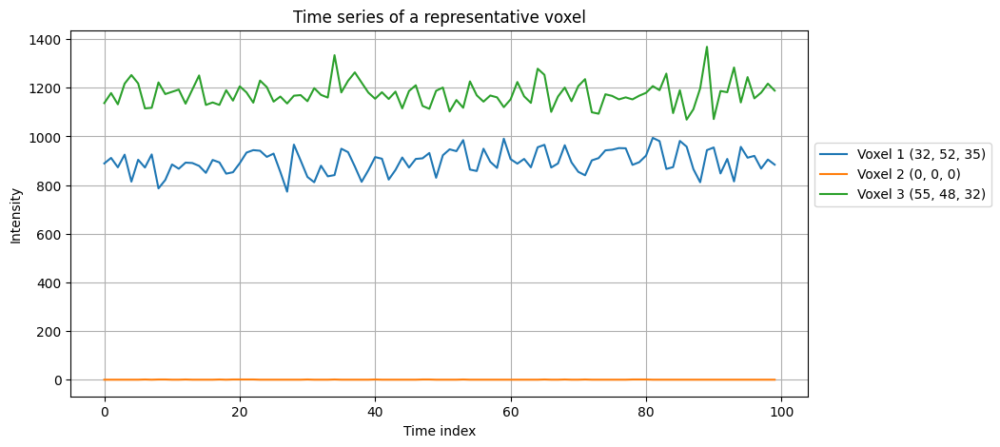

In [30]:
# ตำแหน่ง voxel ที่เราต้องการสำรวจดู (สามารถปรับเปลี่ยนได้)
coords = [
    (32, 52, 35), # Voxel 1
    (0, 0, 0),    # Voxel 2
    (55, 48, 32)  # Voxel 3
]

# plot ข้อมูลเชิงเวลา
plt.figure(figsize=(10, 5))

for i, (x, y, z) in enumerate(coords, start=1):
    time_series = fmri_data[x, y, z, :]
    plt.plot(time_series, label=f'Voxel {i} ({x}, {y}, {z})')

plt.title("Time series of a representative voxel")
plt.xlabel("Time index")
plt.ylabel("Intensity")
plt.legend(loc='lower left', bbox_to_anchor=(1, 0.5))
plt.grid(True)
plt.show()

## Motion Correction

ในขั้นตอนนี้เราจะลองเอาข้อมูลทั้ง 2 ประเภทที่ได้เก็บมา (A2P และ P2A) มาทำ motion correction ผ่านการเรียกใช้ [FSL MCFLIRT](https://ftp.nmr.mgh.harvard.edu/pub/dist/freesurfer/tutorial_packages/centos6/fsl_507/doc/wiki/MCFLIRT.html) (motion correction tool ที่ใช้เทคนิคจาก FSL FLIRT) เพื่อทำให้ข้อมูลจากทุก time points มีตำแหน่งที่ตรงกัน นับเป็นการแก้ความคลาดเคลื่อนที่เกิดจากการขยับศีรษะระหว่างการ scan ในเครื่อง MRI

In [31]:
# เตรียม path สำหรับข้อมูล fMRI ที่จะใช้งาน ในนี้จะมีข้อมูล A2P และ P2A
AP_path = os.path.join(data_path, 'func_AP.nii.gz')
PA_path = os.path.join(data_path, 'func_PA.nii.gz')

# ทำ motion correction แล้ว save ผลลัพธ์ที่ได้ใส่ไฟล์ที่ชื่อว่า 'func_AP_mc.nii.gz' และ 'func_PA_mc.nii.gz'
mc_AP = mcflirt(AP_path, out=os.path.join(output_path, 'func_AP_mc.nii.gz'))
mc_PA = mcflirt(PA_path, out=os.path.join(output_path, 'func_PA_mc.nii.gz'))

เปรียบเทียบดูข้อมูลก่อนและหลังการทำ motion correction

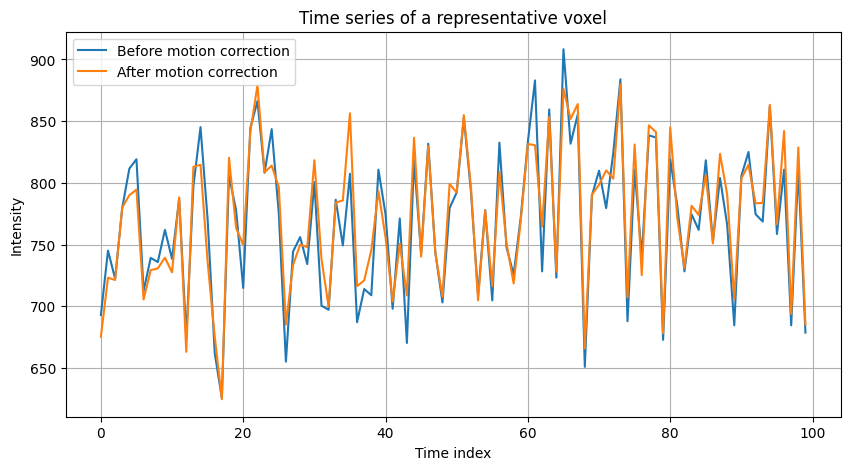

In [32]:
# โหลดข้อมูล AP ก่อนที่จะทำ motion correction
img = nib.load(os.path.join(data_path, 'func_AP.nii.gz'))
fmri_data = img.get_fdata()

# โหลดข้อมูล AP หลังจากที่ทำ motion correction
img = nib.load(os.path.join(output_path, 'func_AP_mc.nii.gz'))
fmri_mc = img.get_fdata()

# ระบุ voxel ที่ต้องการสำรวจ
x, y, z = 60, 60, 15

# ดึงข้อมูล time series ของ voxel ที่เราเลือกไว้
ts_orig = fmri_data[x, y, z, :]
ts_mc = fmri_mc[x, y, z, :]

# plot ข้อมูลเชิงเวลา
plt.figure(figsize=(10, 5))
plt.plot(ts_orig, label='Before motion correction')
plt.plot(ts_mc, label='After motion correction')
plt.title("Time series of a representative voxel")
plt.xlabel("Time index")
plt.ylabel("Intensity")
plt.grid(True)
plt.legend()
plt.show()

**หมายเหตุ** เนื่องจาก subject รายนี้ขยับตัวน้อยในระหว่างสแกน ทำให้ไม่เห็นผลความแตกต่างของ motion correction ก่อนและหลังมากเท่าไหร่ ซึ่งมีค่าความคลาดเคลื่อนเฉลี่ยของตำแหน่ง framewise displacement อยู่ที่ 0.185631 mm

## Distortion Correction

ในการแก้ความบิดเบี้ยวจากความคลาดเคลื่อนของสนามแม่เหล็ก สามารถทำได้หลากหลายวิธี เช่น
1. **Acquisition of an external magnetic field map**
การเก็บข้อมูล B0 map เพิ่มเติมจากข้อมูล structural MRI และ fMRI โดย B0 map นั้น เป็นข้อมูลที่บอกว่าแต่ละ voxel มี local magnetic field ที่เกิดขึ้นจริงเป็นอย่างไร (ซึ่งมักจะแตกต่างจากสิ่งที่เราได้ออกแบบหรือคาดการณ์ไว้) ซึ่งเราจะใช้ข้อมูล B0 map ที่เราได้เก็บมาในการแก้ปัญหา distortion เหล่านี้ (วิธีนี้เป็นวิธีที่นิยม เนื่องจากมีความแม่นยำสูง แต่ก็จะเสียเวลาในการเก็บข้อมูล field map เพิ่มเติมเข้ามาเล็กน้อย เมื่อเปรียบเทียบกับระยะเวลาที่ใช้ในการเก็บข้อมูล structural MRI หรือ fMRI แล้ว ระยะเวลาที่ใช้ในการเก็บ B0 map นั้นน้อยกว่ามาก)
2. **Non-rigid registration**
เราสามารถใช้ non-linear registration จากข้อมูล fMRI ไปยัง structural MRI เพื่อพยายามแก้ไขความบิดเบี้ยวของภาพได้ ซึ่งในหลาย ๆ ครั้ง ตัว structural MRI เองก็มี distortion ด้วยเช่นกัน ส่งผลให้มีสามารถแก้ distortion ลดลง
3. **Two fMRI data acquired using echo planar imaging (EPI) with opposite phase encoding directions**
ในกรณีที่ไม่ได้เก็บ external magnetic field map มา เราสามารถใช้ภาพ fMRI ที่เก็บมาด้วยเทคนิค EPI ในทิศทางตรงกันข้ามกัน (เช่น A2P และ P2A) มาสร้าง estimated magnetic field map ได้ (ประสิทธิภาพดีในภาพรวม แต่ในบางส่วนของสมองอาจจะไม่ดีเท่าการใช้ external magnetic field map ในการแก้ไขความบิดเบี้ยว)

Reference: Schallmo, M. P., Weldon, K. B., Burton, P. C., Sponheim, S. R., & Olman, C. A. (2021). Assessing methods for geometric distortion compensation in 7 T gradient echo functional MRI data. Human brain mapping, 42(13), 4205–4223. https://doi.org/10.1002/hbm.25540

<br>

ใน subsection นี้เราจะประมาณค่า magnetic field map จากข้อมูล A2P และ P2A แล้วนำเอา estimated magnetic field map ที่ได้มาใช้แก้ distortion ผ่านเทคนิคที่ชื่อว่า [topup](https://web.mit.edu/fsl_v5.0.10/fsl/doc/wiki/topup.html) โดยมีขั้นตอนดังนี้

1. ทำการ concatenate ข้อมูล A2P และ P2A เข้าด้วยกัน
2. นำข้อมูลที่ผ่านการ concatenate ในขั้นตอนก่อนหน้ามาประมาณค่า magnetic field map
3. นำเอา estimated magnetic field map มาใช้แก้ distortion

**หมายเหตุ** ในบทเรียนนี้เราจะทำ distortion correction กับข้อมูลแค่ time point แรกเท่านั้น เพื่อให้ไม่เสียเวลาในการเรียนรู้บทเรียนนี้มากจนเกินไป แต่ในการทำงานจริง เราควรนำเอาข้อมูลจากทุก time point มาทำ distortion correction

### ขั้นตอนที่ 1 ทำการ concatenate ข้อมูล A2P และ P2A เข้าด้วยกัน

In [33]:
# เลือกมาเฉพาะ volume แรก (time point แรก) ของข้อมูล fMRI โดยการเรียกใช้ fslroi ซึ่งในการทำงานจริงเราควรทำทุก ๆ time point
fslroi(os.path.join(output_path, 'func_AP_mc.nii.gz'), os.path.join(output_path, 'func_AP_roi.nii.gz'), 0, 1)
fslroi(os.path.join(output_path, 'func_PA_mc.nii.gz'), os.path.join(output_path, 'func_PA_roi.nii.gz'), 0, 1)

## ทำการ concatenate ข้อมูล A2P และ P2A ด้วย nibabel
# โหลดข้อมูล
func_AP_roi_img = nib.load(os.path.join(output_path, 'func_AP_roi.nii.gz'))
func_PA_roi_img = nib.load(os.path.join(output_path, 'func_PA_roi.nii.gz'))
func_AP_roi_data = func_AP_roi_img.get_fdata()
func_PA_roi_data = func_PA_roi_img.get_fdata()

# Concatenate ข้อมูล A2P เข้ากับ P2A...ตรงนี้เราอาจจะต้องระวังเรื่องการใส่ค่า axis ในกรณีที่เราต้องการ process ข้อมูลในหลาย ๆ time points พร้อมกันด้วย
merged_data = np.concatenate((func_PA_roi_data[..., np.newaxis], func_AP_roi_data[..., np.newaxis]), axis=3)

# นำเอาข้อมูลที่ได้ผ่านการ concatenate แล้วมาสร้างเป็น NIfTI และ save ไว้ใน output folder เพื่อใช้งานต่อ
merged_img = nib.Nifti1Image(merged_data, affine=func_AP_roi_img.affine)
nib.save(merged_img, os.path.join(output_path, 'merged_roi.nii.gz'))

Plot ดูข้อมูลที่ผ่านการ merged มา ซึ่งในกรณีนี้

In [34]:
plot_brain_4D(os.path.join(output_path, 'merged_roi.nii.gz'), 'Orientation', 'Slice', 'A2P or P2A')

interactive(children=(IntSlider(value=0, description='Orientation', max=2), IntSlider(value=0, description='Sl…

### ขั้นตอนที่ 2 นำข้อมูลที่ผ่านการ concatenate ในขั้นตอนก่อนหน้ามาประมาณค่า magnetic field map

ใช้คำสั่ง topup เพื่อประมาณค่า magnetic field map

In [35]:
# ใช้คำสั่ง topup เพื่อประมาณค่า magnetic field map จากข้อมูล A2P and P2A
topup(imain=os.path.join(output_path, 'merged_roi.nii.gz'),
      datain=os.path.join(data_path, 'acqparams.txt'), # ข้อมูล parameters ที่เราใช้ในการเก็บข้อมูล (acquisition parameters)
      config=os.path.join(data_path, 'b02b0.cnf'),
      out=os.path.join(output_path, 'topup_results'))

{}

ลองดูหน้าตาของ magnetic field map ที่ได้ประมาณค่ามา

In [36]:
# topup field coefficient เป็น map ใช้สำหรับทำ distortion correction
plot_brain_3D(os.path.join(output_path, 'topup_results_fieldcoef.nii.gz'))

interactive(children=(IntSlider(value=0, description='Orientation', max=2), IntSlider(value=0, description='Sl…

### ขั้นตอนที่ 3 นำเอา estimated magnetic field map มาใช้แก้ distortion

In [37]:
# ใช้คำสั่ง applytopup เพื่อแก้ distortion
applytopup(imain=os.path.join(output_path, 'func_PA_mc.nii.gz'),
           datain=os.path.join(data_path, 'acqparams.txt'),
           topup=os.path.join(output_path, 'topup_results'),
           index=1,
           out=os.path.join(output_path, 'func_PA_unwarped.nii.gz'),
           method='jac',
           stderr=None)
applytopup(imain=os.path.join(output_path, 'func_AP_mc.nii.gz'),
           datain=os.path.join(data_path, 'acqparams.txt'),
           topup=os.path.join(output_path, 'topup_results'),
           index=2,
           out=os.path.join(output_path, 'func_AP_unwarped.nii.gz'),
           method='jac',
           stderr=None)

{}

เปรียบเทียบข้อมูล A2P ก่อนและหลังการทำ distortion correction

จะเห็นได้ว่าข้อมูลมีความบิดเบี้ยวที่ลดลง


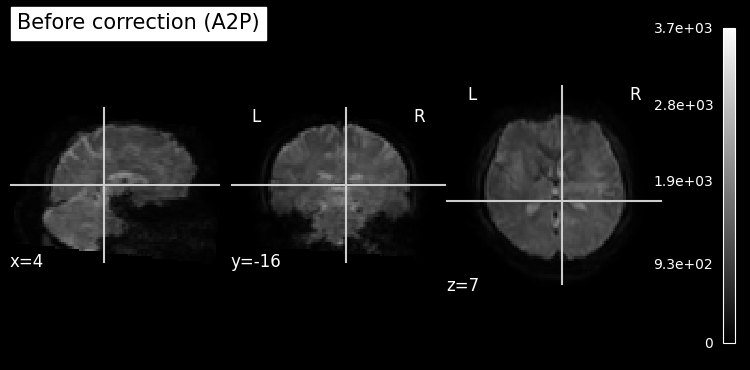

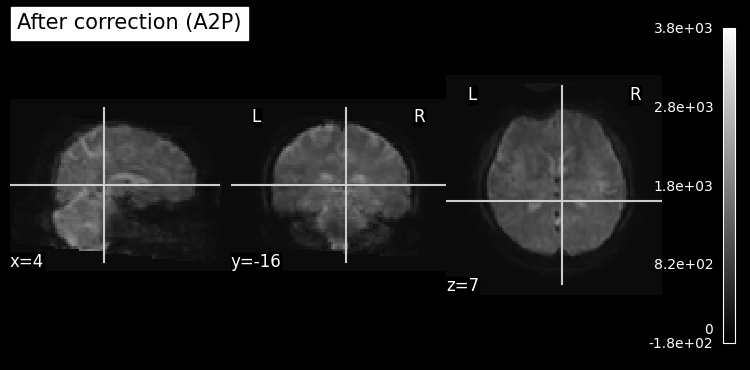

In [38]:
# visualize ภาพที่ผ่านการแก้ไข distortion correction
target_time_index = 1 # เลือก time point ที่ต้องการ
orig = (os.path.join(output_path, 'func_AP_mc.nii.gz'))
unwarped = (os.path.join(output_path, 'func_AP_unwarped.nii.gz'))

plot_anat(index_img(orig, target_time_index), cut_coords=(4,-16,7), title='Before correction (A2P)')
plot_anat(index_img(unwarped, target_time_index), cut_coords=(4,-16,7), title='After correction (A2P)')

print(f"จะเห็นได้ว่าข้อมูลมีความบิดเบี้ยวที่ลดลง")

เปรียบเทียบข้อมูล P2A ก่อนและหลังการทำ distortion correction

จะเห็นได้ว่าข้อมูลมีความบิดเบี้ยวที่ลดลง


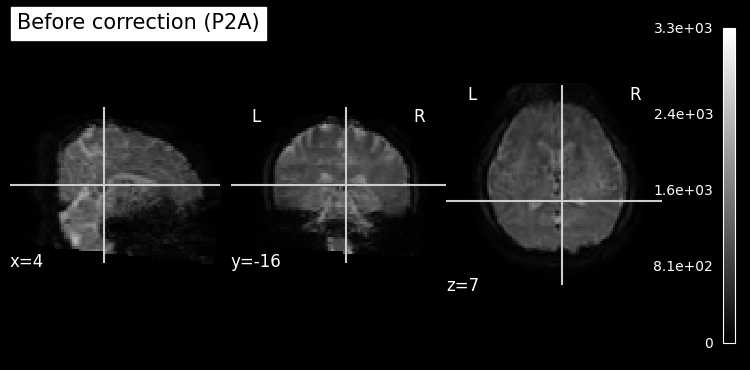

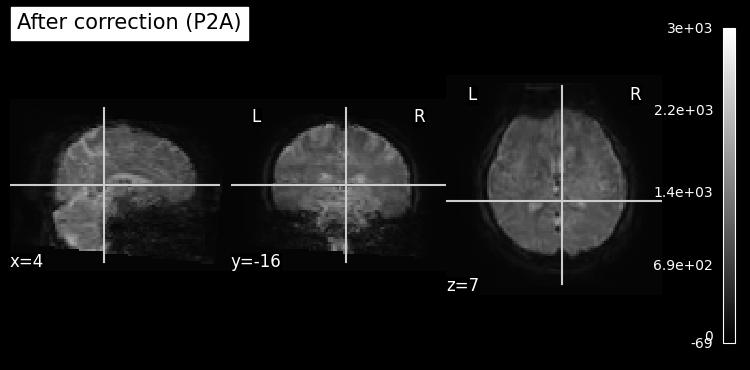

In [39]:
target_time_index = 1
orig = (os.path.join(output_path, 'func_PA_mc.nii.gz'))
unwarped = (os.path.join(output_path, 'func_PA_unwarped.nii.gz'))

plot_anat(index_img(orig, target_time_index), cut_coords=(4,-16,7), title='Before correction (P2A)')
plot_anat(index_img(unwarped, target_time_index), cut_coords=(4,-16,7), title='After correction (P2A)')

print(f"จะเห็นได้ว่าข้อมูลมีความบิดเบี้ยวที่ลดลง")

## READ ME

หลังจากจากที่เราได้ทำการแก้ไข distortion correction แล้ว เราสามารถนำเอาข้อมูล A2P และ P2A ไปผ่านการประมวลผลและวิเคราะห์ผลต่อแยกจากกันได้

ดังนั้นเพื่อไม่ให้เป็นการเสียเวลา เราจะเรียนรู้ขั้นตอนที่เหลือโดยใช้แค่ข้อมูล A2P เท่านั้น หากผู้เรียนสนใจ สามารถนำเอาข้อมูล P2A มาประมวลผลต่อได้เช่นกัน

## (Optional) Smoothing
เราสามารถเรียกใช้ `fslmaths` ในการทำ smoothing เพื่อเพิ่ม signal-to-noise ratio (SNR) ของข้อมูลได้ โดยกราฟด้านล่างจะแสดง overall signal ที่เพิ่มขึ้นใน voxel ตัวอย่าง หลังจากการทำ smoothing 1 voxel

In [40]:
# โหลดข้อมูลที่ได้รับการทำ motion correction และ distortion correction แล้ว
input_file = os.path.join(output_path, 'func_AP_unwarped.nii.gz')
output_file = os.path.join(output_path, 'func_AP_unwarp_smth.nii.gz')

# ใช้ fslmaths ในการทำ smoothing แล้ว save ผลลัพธ์ที่ได้ไว้ในไฟล์ที่ชื่อว่า func_AP_unwarp_smth.nii.gz
fslmaths(input_file).smooth(sigma=2.12).run(output=output_file)

{}

ดูข้อมูลที่ได้รับหลังขั้นตอน smoothing

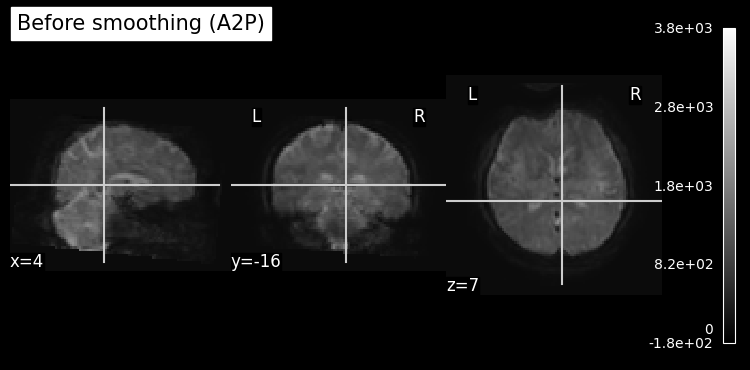

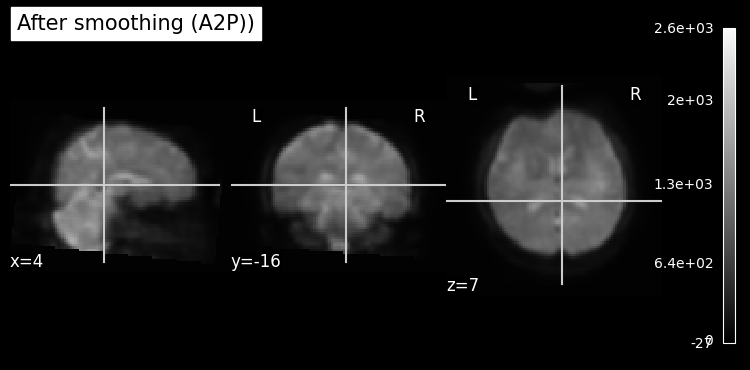

In [41]:
target_time_index = 1
unwarped = (os.path.join(output_path, 'func_AP_unwarped.nii.gz'))
smooth = os.path.join(output_path, 'func_AP_unwarp_smth.nii.gz')

plot_anat(index_img(unwarped, target_time_index), cut_coords=(4,-16,7), title='Before smoothing (A2P)')
plot_anat(index_img(smooth, target_time_index), cut_coords=(4,-16,7), title='After smoothing (A2P))')

ลองมาดูข้อมูล time series ของ voxel ตัวอย่าง 1 voxel เพื่อเปรียบเทียบ time series ก่อนและหลังการทำ smoothing กัน

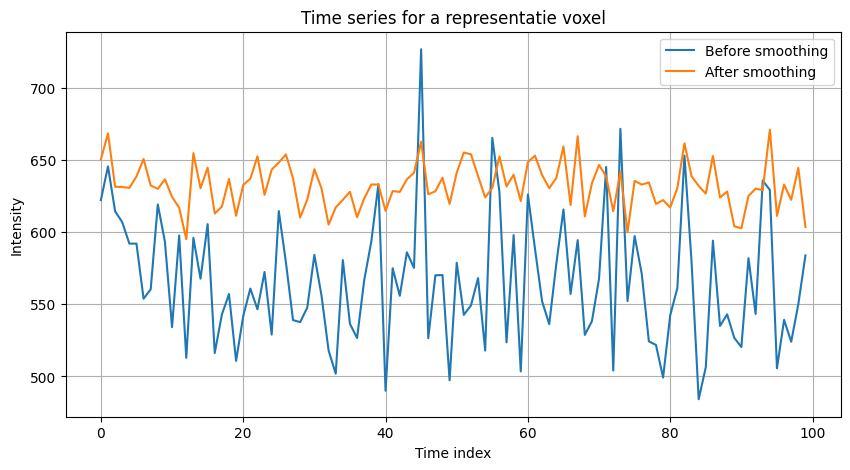

In [42]:
# ข้อมูลก่อน smoothing
img = nib.load(os.path.join(output_path, 'func_AP_unwarped.nii.gz'))
fmri_unwarp = img.get_fdata()

# ข้อมูลหลัง smoothing
img = nib.load(os.path.join(output_path, 'func_AP_unwarp_smth.nii.gz'))
fmri_smth = img.get_fdata()

x, y, z = 60, 60, 15
ts_unwarp = fmri_unwarp[x, y, z, :]
ts_smth = fmri_smth[x, y, z, :]

# plot ข้อมูลเชิงเวลา
plt.figure(figsize=(10, 5))
plt.plot(ts_unwarp, label="Before smoothing")
plt.plot(ts_smth, label="After smoothing")
plt.title("Time series for a representatie voxel")
plt.xlabel("Time index")
plt.ylabel("Intensity")
plt.grid(True)
plt.legend()
plt.show()

จาก cell ก่อนหน้าที่มีทั้งภาพ และมี time series จะเห็นได้ว่าข้อมูลหลังจากการทำ smoothing มี noise ลดลงมาก แต่ก็แลกมากับการที่เรามี spatial resolution ที่ลดลง (ภาพเบลอ)

**หมายเหตุ**
1. ในบาง application ทาง neuroscience เราไม่มีความจำเป็นจะต้องใช้ spatial resolution ที่สูงมากนัก การทำขั้นตอน smoothing ใน application เหล่านั้น จึงเป็นขั้นตอนที่อาจจะมีประโยชน์ แต่สำหรับ application ที่ต้องการ spatial resolution ที่ดี เราอาจจะไม่ทำ smoothing หรือ ทำ smoothing ที่มี kernel ที่มีขนาดเล็กลงมา
2. ในบทเรียนนี้ เราทำ smoothing ก่อนที่เราจะทำ registration แต่ในความเป็นจริงแล้ว เราอาจจะสลับลำดับของขั้นตอนทั้ง 2 ได้ ขึ้นอยู่กับหลายปัจจัย เข่น
  - ถ้าหากข้อมูลของเรามี noise ที่น้อยอยู่แล้ว เราอาจจะทำ registration ก่อน เพื่อให้เราสามารถใช้ประโยชน์จาก spatial resolution ตั้งต้นได้ หากเราทำ smoothing ก่อนอาจทำให้เราเสียความคมชัดของภาพ ซึ่งจะกระทบต่อความแม่นยำของการทำ registration ได้
  - ถ้าหากข้อมูลของเรามี noise ที่มากจนมันไปกระทบต่อความสามารถในการทำ registration เราอาจจะต้องทำการลด noise หรือกำจัด artifacts ออกไปก่อนการทำ registration ซึ่งการทำ smoothing ก็เป็นหนึ่งในวิธีที่ง่ายและเป็นที่นิยม

## (Optional) ICA Noise Removal

ขั้นตอนนี้เป็นขั้นตอน optional ซึ่งเราจะใช้ Independent Component Analysis (ICA) ในการจำกัด noise และ/หรือ artifacts ออกไป

MELODIC (Multivariate Exploratory Linear Optimized Decomposition into Independent Components) ใช้สำหรับการ preprocess วิเคราะห์ข้อมูล fMRI โดยเฉพาะการทำ ICA เพื่อแยกสัญญาณต่างๆ ออกจาก noise ที่อาจจะเกิดขึ้นได้ ในที่นี้จะกล่าวถึง melodic และ ICA ในกรณี single-subject preprocessing ในกรณี ของ group analysis จะยังไม่ได้พูดถึงในบทเรียน

<br>

ในการแยกองค์ประกอบ Independent Component (IC) ว่าเป็น signal หรือ noise สามารถทำได้หลายวิธี โดยเราจะเริ่มจาก Manual Classification ก่อน ซึ่งจำเป็นต้องพิจารณาข้อมูล 3 ส่วนหลัก ๆ ได้แก่
1. Spatial map
2. Time series
3. Power spectrum

การดู spatial map จะช่วยแยกแยะชนิดของสัญญาณ และ time series/power spectrum จะช่วงบ่งบอกคุณภาพของสัญญาณ โดย bold response มักจะมีค่าน้อยกว่า 0.1 Hz ลงมาตามที่แสดงในภาพด้านล่าง

Reference https://open.win.ox.ac.uk/pages/fslcourse/practicals/ica/index.html

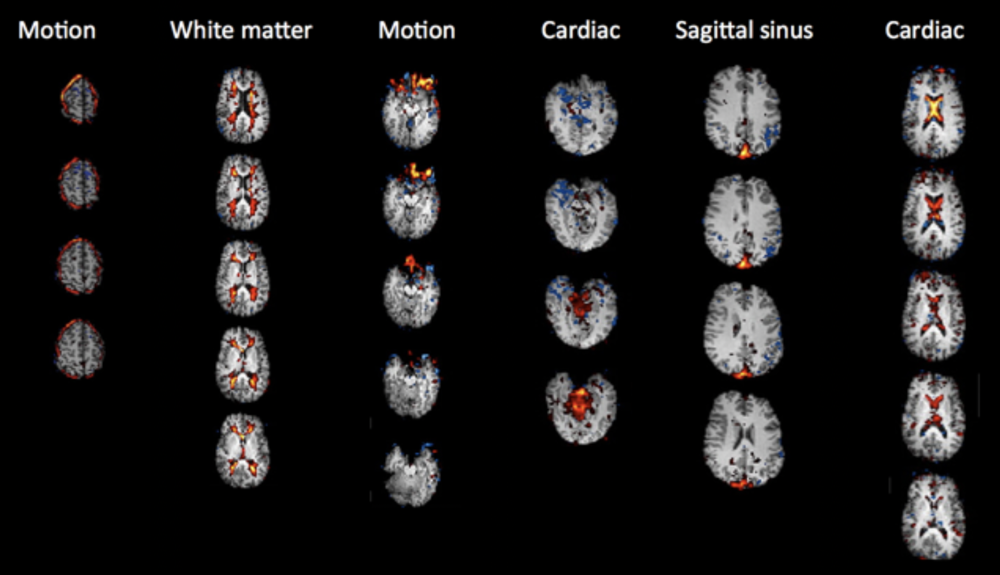

In [43]:
display(Image('./tutorial-graphics/spatial-map.png'))

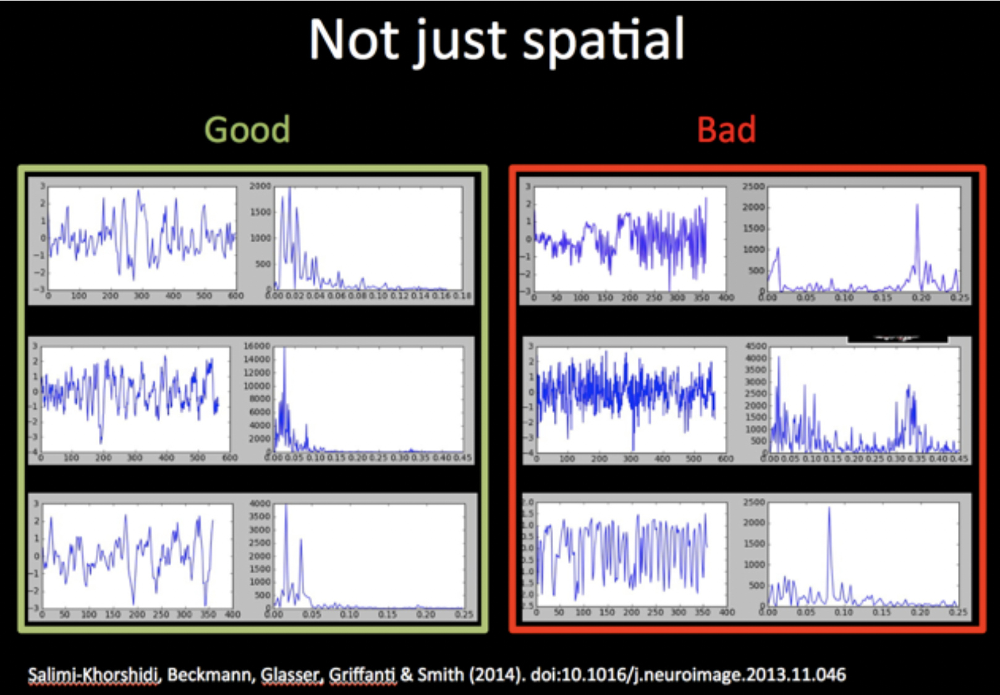

In [44]:
display(Image('./tutorial-graphics/temporal-map.png'))

In [45]:
# รัน melodic ด้วยจำนวน ICs เท่ากับ 15
input_file = os.path.join(output_path, 'func_AP_unwarp_smth.nii.gz')
output_dir = os.path.join(output_path, 'melodic_output')

melodic = melodic(input_file,
                  outdir=output_dir,
                  dim=15)

ในทางปฏิบัติ สำหรับ single-subject cleaning เราจะนิยมให้ melodic ทำการประเมินจำนวน ICs เอง โดยจะมีจำนวน ICs ราวๆ 200-400 components และจะใช้ automatic IC classification เช่น [FMRIB’s ICA-based Xnoiseifier (FIX)](https://web.mit.edu/fsl_v5.0.10/fsl/doc/wiki/FIX.html) หรือ [ICA-based Automatic Removal Of Motion Artifacts (AROMA)](https://github.com/maartenmennes/ICA-AROMA) ในการระบุ noise component และ clean ข้อมูลต่อไป

In [46]:
# Visualize ICs 15 components
ICAcomponent = os.path.join(output_path, 'melodic_output/melodic_IC.nii.gz')

plot_brain_4D(ICAcomponent)

interactive(children=(IntSlider(value=0, description='Orientation', max=2), IntSlider(value=0, description='Sl…

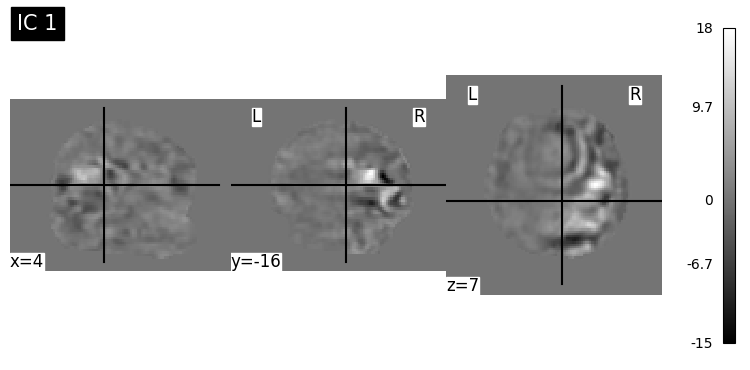

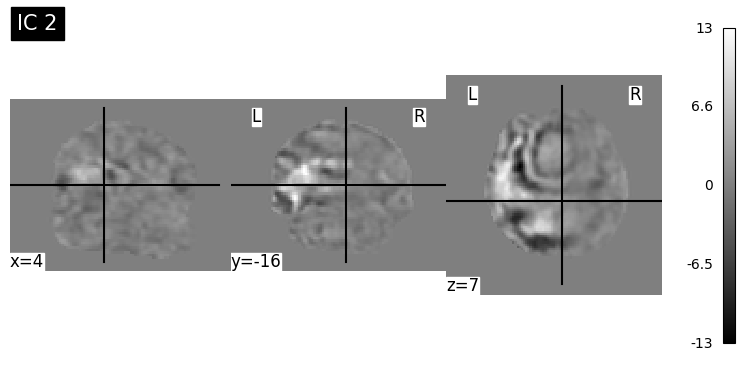

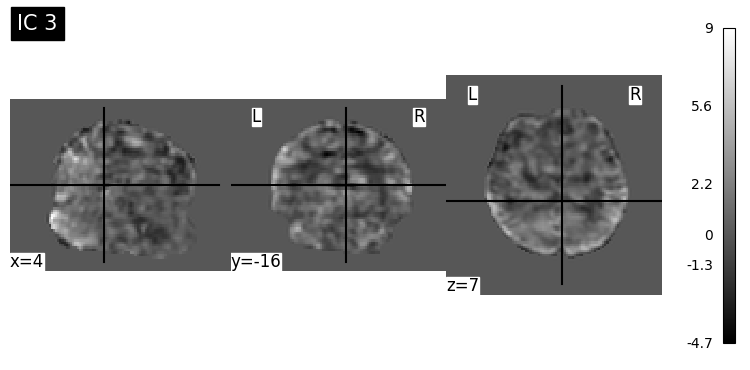

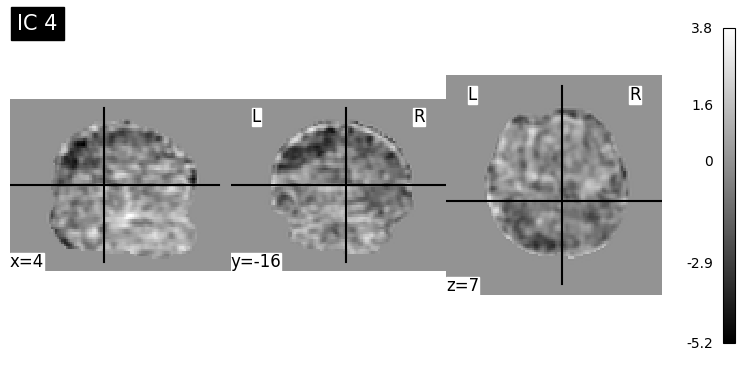

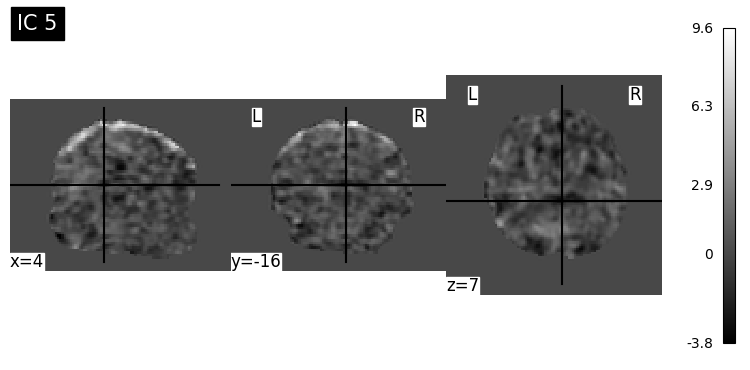

...

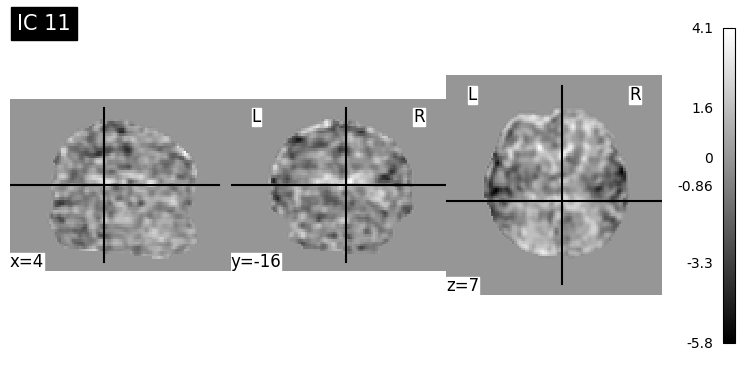

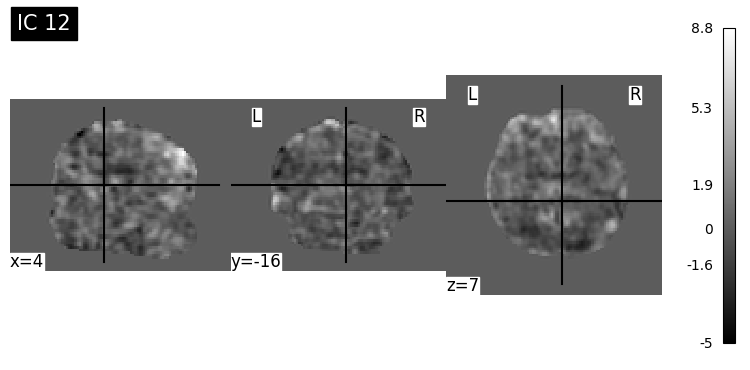

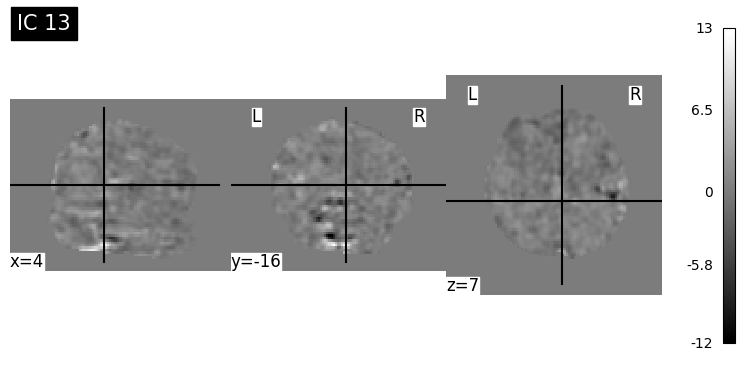

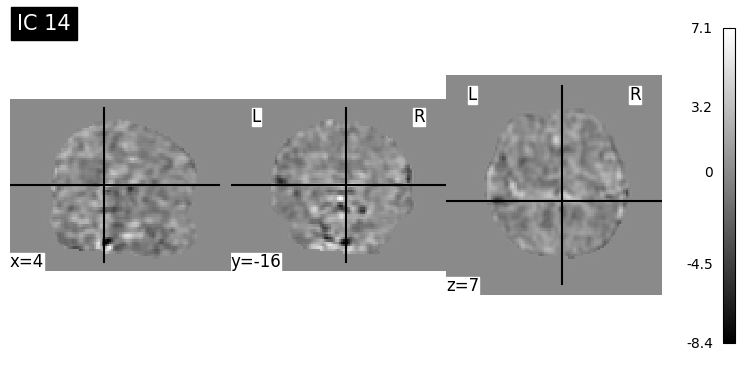

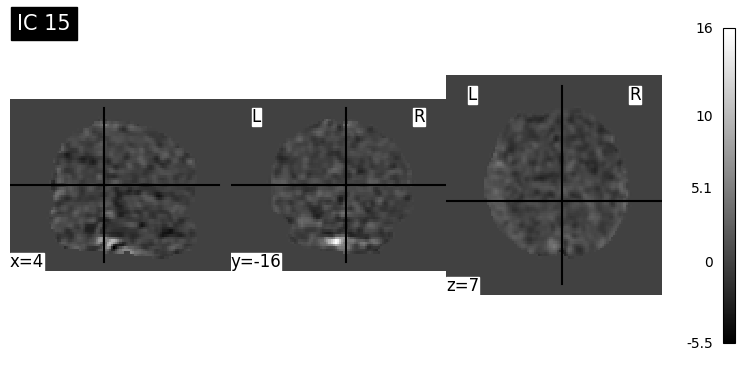

In [47]:
for i in range(15):
    plot_img(index_img(ICAcomponent, i), title=f'IC {i+1}', cut_coords=(4,-16,7))

**Discussion Point 1** จากข้อมูล spatial map เบื้องต้นใน 15 ICs สามารถระบุชนิดของ signal/noise ในแต่ละ component ได้หรือไม่ ICs ไหนคือสัญญาณอะไรบ้าง หรือมี brain network บางประเภทที่สามารถ extract ออกมาจาก ICA หรือไม่

เนื่องจากข้อมูลที่นำมาเป็น time series 100 time steps,

TR (repetition time) = 2.5 second

total time = 100*2.5 = 250 second

sampling frequency = 1/TR = 0.4 Hz

In [48]:
# ดึงข้อมูล time series ของแต่ละ ICs
ts = getComponentTimeSeries(output_dir)
ts.shape

(100, 15)

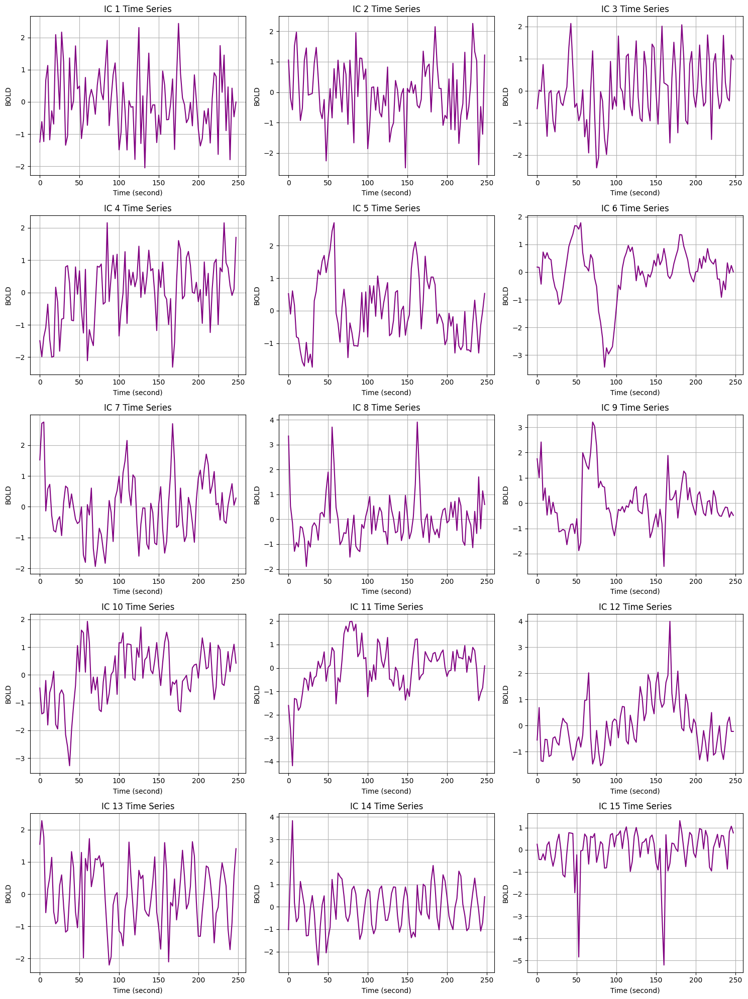

In [49]:
time = np.arange(ts.shape[0])*2.5

plt.figure(figsize=(15, 20))
for i in range(ts.shape[1]):
    plt.subplot(5, 3, i + 1)  # 5 rows and 3 columns
    plt.plot(time, ts[:, i], c='purple')
    plt.title(f'IC {i + 1} Time Series')
    plt.xlabel('Time (second)')
    plt.ylabel('BOLD')
    plt.grid(True)

plt.tight_layout()
plt.show()

In [50]:
# ดึงข้อมูล power spectrum ของแต่ละ ICs
psd = getComponentPowerSpectra(output_dir)
psd.shape

(50, 15)

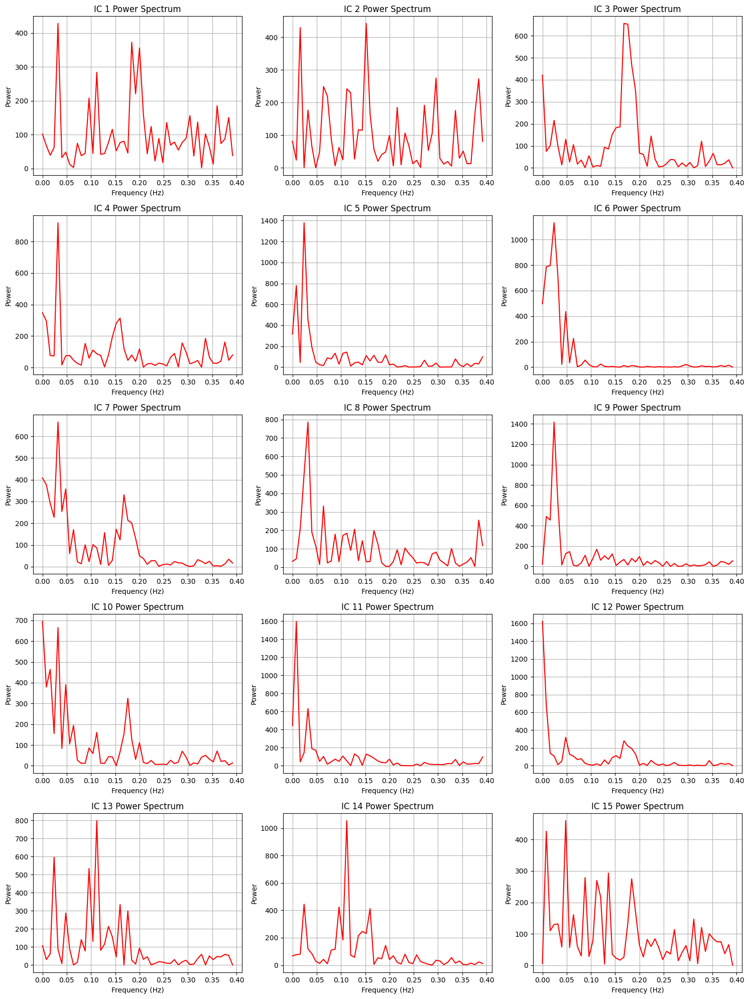

In [51]:
# Plot each component's power spectrum
num_components = psd.shape[1]
frequency = np.arange(psd.shape[0])*0.4/50

plt.figure(figsize=(15, 20))

for i in range(num_components):
    plt.subplot(5, 3, i + 1)  # 5 rows and 3 columns for a total of 15 plots
    plt.plot(frequency, psd[:, i], c='red')
    plt.title(f'IC {i + 1} Power Spectrum')
    plt.xlabel('Frequency (Hz)')
    plt.ylabel('Power')
    plt.grid(True)

plt.tight_layout()
plt.show()

**Discussion Point 2** จากข้อมูล time series และ power spectrum พอจะบอกได้หรือไม่ว่า ICs ใด เป็น good or bad signal และถ้าหากรวมกับข้อมูล spatial map แล้ว เราจะ filter component ใดทิ้งบ้าง และเรามีกลยุทธ์ในการเลือกอย่างไร

หลังจากเราสามารถระบุ component ที่ต้องการกำจัดออกได้แล้ว เราสามารถใช้ regression เพื่อกำจัด noise components ออกจาก data fMRI ของเราได้ (สามารถเรียกใช้ `fsl_regfilt` ได้) ซึ่งเราจะไม่ได้ทำในบทเรียนนี้

## Coregistration

ในขั้นตอนนี้เราจะทำ two-step registration ซึ่งเป็นการทำ registration 2 ขั้นตอนต่อเนื่องกัน

1. register ข้อมูล fMRI ไปยัง structural MRI
2. register ข้อมูล fMRI ที่ได้หลังจบขั้นตอนแรก ไปยัง MNI152 template ที่เราได้ใช้งานตอนที่เรา preprocess structural MRI

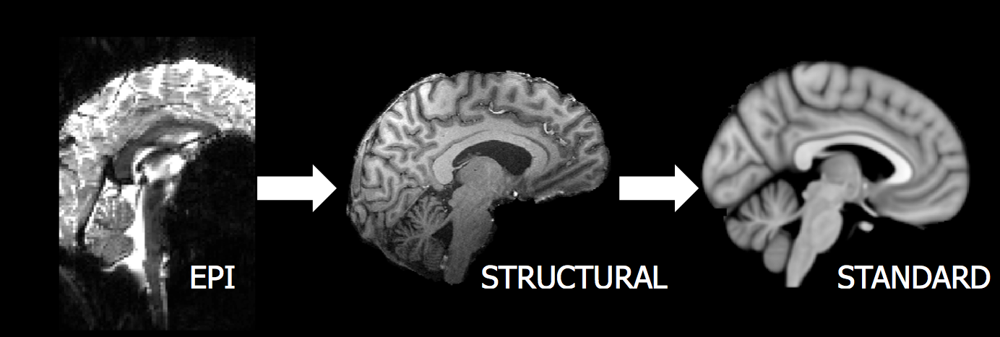

image source: https://web.mit.edu/fsl_v5.0.10/fsl/doc/wiki/FLIRT%282f%29StepByStep.html


In [52]:
display(Image('./tutorial-graphics/two-step-registration.png'))
print(f'image source: https://web.mit.edu/fsl_v5.0.10/fsl/doc/wiki/FLIRT%282f%29StepByStep.html')

**หมายเหตุ**
1. ในตัวอย่างนี้เราจะใช้ไฟล์ตั้งต้นเป็นไฟล์ที่ไม่ได้ผ่านการทำ ICA มา ถ้าหากว่าต้องการใช้ไฟล์ที่ทำ ICA มาด้วย ขอให้ผู้เรียนปรับแก้ตัวแปร `input_image` ใน cell ถัดไปให้เป็นไฟล์ที่ผ่านการทำ ICA ที่ผู้เรียนได้ save เอาไว้
2. ในตัวอย่างนี้เราจะทำ registration สำหรับ time point แรกเป็นตัวอย่างเท่านั้น ถ้าหากต้องการทำสำหรับทุก time point เราสามารถใช้ `fsl.wrappers.flirt.applyxfm4D(src, ref, out, mat, **kwargs)` ได้ โดยสามารถดูรายละเอียดได้ที่ [ข้อมูลเบื้องต้นของ fslpy](https://open.win.ox.ac.uk/pages/fsl/fslpy/fsl.wrappers.flirt.html) หรือ [ข้อมูลเพิ่มเติมจาก FSL](https://web.mit.edu/fsl_v5.0.10/fsl/doc/wiki/FLIRT(2f)UserGuide.html)

### ขั้นตอนที่ 1 register fMRI ไปยัง structural MRI

ในที่นี้ข้อมูล structural MRI ถูกเก็บไว้ในไฟล์ชื่อว่า `struc_brain.nii.gz`

In [53]:
# functional to structural space
input_image = os.path.join(output_path, 'func_AP_unwarp_smth.nii.gz') # ในตัวอย่างนี้เราจะใช้ข้อมูลที่ไม่ได้ผ่านการทำ ICA มาเป็นข้อมูลตั้งต้น
reference_image = os.path.join(output_path, 'struc_brain.nii.gz') # ใช้ structural MRI เป็น reference
output_matrix = os.path.join(output_path, 'func_to_struc_AP.mat')
output_image = os.path.join(output_path, 'func_to_struc_AP.nii.gz')

flirt_result = flirt(src=input_image,
                     ref=reference_image,
                     omat=output_matrix,
                     out=output_image)

การรัน cell ข้างบนจะส่งผลให้เกิด warning ขึ้นมา เนื่องจากข้อมูลที่เราใส่เข้าไปใน `flirt` เป็นข้อมูล 4 มิติ (x,y,z,t) แต่ในการเรียกใช้ `flirt` ในลักษณะนี้ เราควรใส่ข้อมูล 3 มิติ (a single 3D volume) เข้าไป

> Warning: An input intended to be a single 3D volume has multiple timepoints. Input will be truncated to first volume, but this functionality is deprecated and will be removed in a future release.



เนื่องจากเราต้องการจะทำ registration ให้เป็นตัวอย่างกับ time point แรกเท่านั้น (first volume) เราจึงไม่ต้องสนใจ warning นี้ก็ได้

เปรียบเทียบก่อนและหลังการทำ registration ไปยัง structural MRI

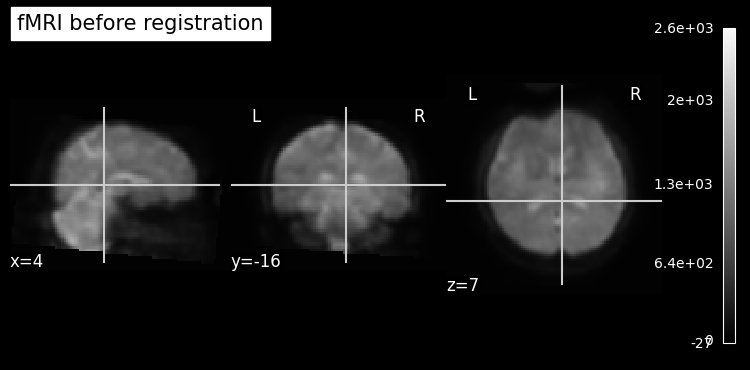

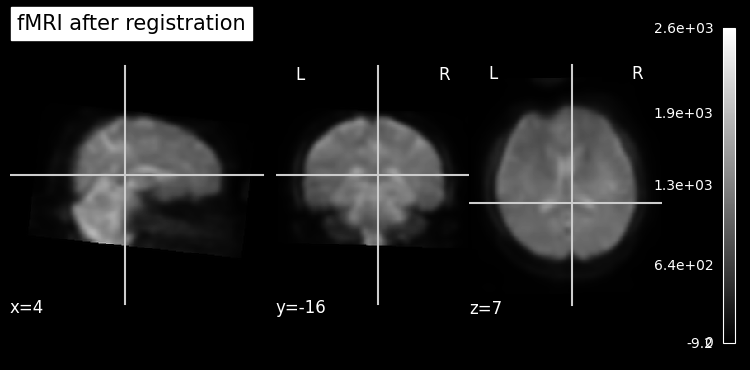

In [54]:
target_time_index = 1

plot_anat(index_img(input_image, target_time_index), cut_coords=(4,-16,7), title='fMRI before registration')
plot_anat(output_image, cut_coords=(4,-16,7), title='fMRI after registration')

### ขั้นตอนที่ 2 นำเอาผลที่ได้จากขั้นตอนแรกไป register ต่อไปยังข้อมูล template

ถึงขั้นตอนนี้ ข้อมูล fMRI ได้ถูก register ไปยังข้อมูล structural MRI แล้ว ต่อมาเราจะใช้ transformation matrix ที่เราได้มาจาก section ที่มีชื่อว่า Structural MRI Preprocessing (ไฟล์ `'transform_reg_mat_brain_to_mni.mat`) มาใช้ทำ registration ข้อมูลต่อไปยัง MNI152 template space

In [55]:
input_image = output_image
reference_image = os.path.join(template_path, 'MNI152_T1_2mm_brain.nii.gz')
transformation_matrix = output_transform_reg_matrix # นำเอา transformation matrix มาจากขั้นตอนการทำ registration สำหรับ structural MRI
output_image = os.path.join(output_path, 'func_to_mni_AP.nii.gz')
output_matrix = os.path.join(output_path, 'transform_reg_mat_func_to_mni_AP.mat')

flirt_result = flirt(src=input_image,
                     ref=reference_image,
                     init=transformation_matrix,
                     applyxfm=True,
                     omat=output_matrix,
                     out=output_image)

ลองดูผลที่ได้รับ

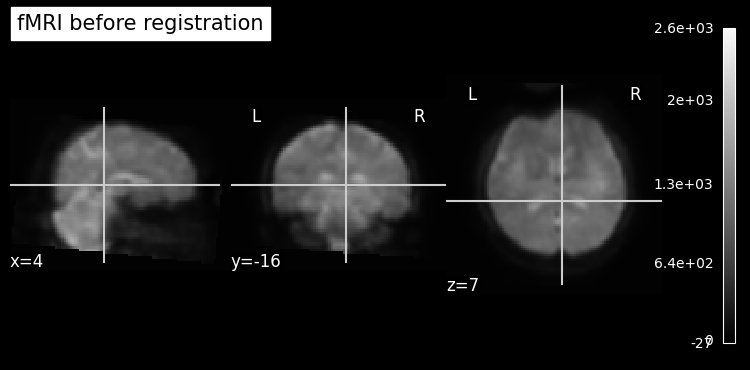

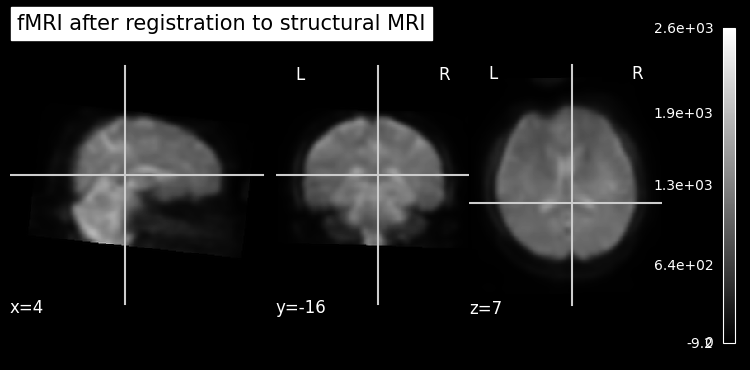

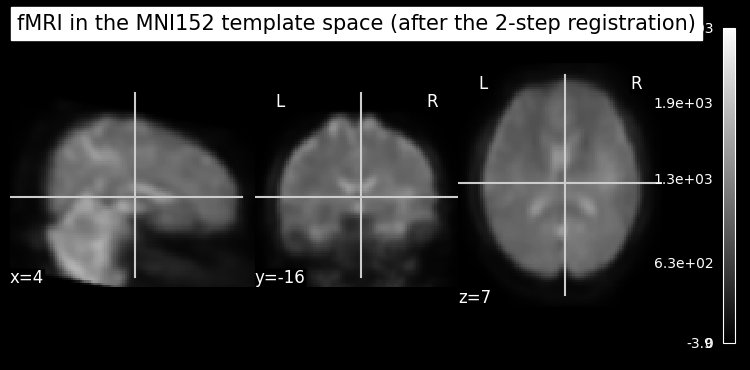

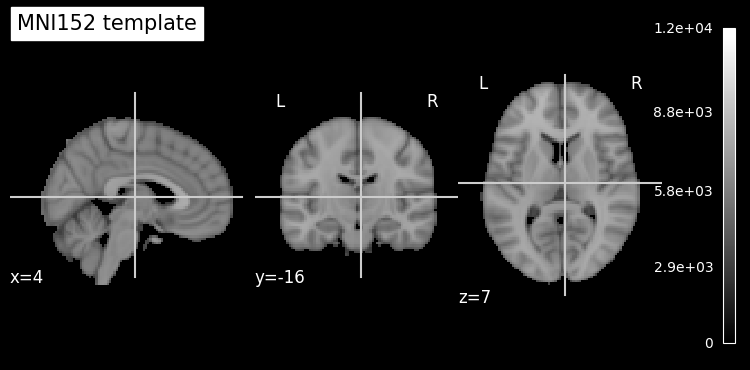

In [56]:
target_time_index = 1

plot_anat(index_img(os.path.join(output_path, 'func_AP_unwarp_smth.nii.gz'), target_time_index), cut_coords=(4,-16,7), title='fMRI before registration')
plot_anat(os.path.join(output_path, 'func_to_struc_AP.nii.gz'), cut_coords=(4,-16,7), title='fMRI after registration to structural MRI')
plot_anat(os.path.join(output_path, 'func_to_mni_AP.nii.gz'), cut_coords=(4,-16,7), title='fMRI in the MNI152 template space (after the 2-step registration)')
plot_anat(os.path.join(template_path, 'MNI152_T1_2mm_brain.nii.gz'), cut_coords=(4,-16,7), title='MNI152 template')

**Discussion Point 3** หลังจากที่เราได้ภาพ fMRI ที่ผ่าน preprocessing มาเรียบร้อยแล้ว เราสามารถดึงข้อมูล imaging derived parameters (IDP) ชนิดใดออกมาได้บ้าง และแต่ละ measures มีจุดเด่นและข้อควรระวังอย่างไรบ้าง

# Outro
หลังจากที่เราได้ทำการ preprocess ข้อมูล fMRI ตามบทเรียนนี้แล้ว เราสามารถนำเอาข้อมูลไปทำการวิเคราะห์ต่อได้ โดยเรามักจะเห็นการแบ่งเป็นการวิเคราะห์ 2 ประเภทหลัก คือ

1. Voxel-based Analysis (VBA) เช่น Seed-based Analysis (SBA), Independent Component Analysis (ICA), Fractional Amplitude of Low-frequency Fluctuations (fALFF/ALFF), และ Regional Homogeneity (ReHo)

2. Node-based Analysis ตัวอย่างตามภาพด้านล่าง

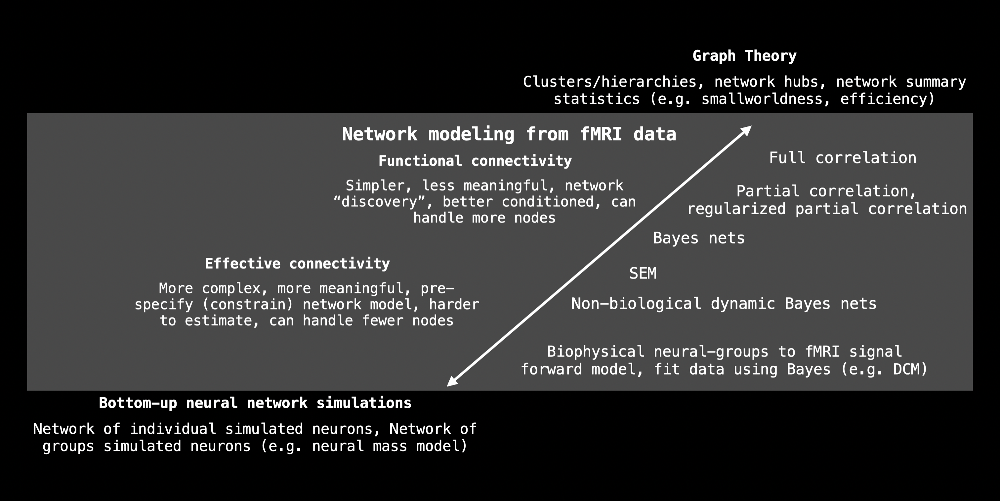

In [57]:
display(Image('./tutorial-graphics/node-based-analysis.png'))

# ผู้จัดทำ

**ผู้จัดทำบทเรียน** นพ.เสฏฐนันท์ จารุเกษมกิจ

**ผู้ปรับแก้บทเรียนเชิงเทคนิคและเพิ่มรายละเอียดคำอธิบาย** ดร. อิทธิ ฉัตรนันทเวช, ดร. สุรัฐ ธีรพิทยานนท์

**ผู้ตรวจสอบบทเรียน** ผศ.พิเศษ ดร. ชัยภัทร ชุณหรัศมิ์